# Crime in Los Angeles 2010-2019

# Aim of project
I collected data from 2010-2019 from the Los Angeles section from the Los Angeles Police Department's (LAPD) website. I aim to firstly look for any suspected errors in the dataset (Objective 1) and comment on the prevalence, and the seriousness of the errors. I will then clean the dataset to avoid some of the errors, but also to make managing and visualising the data easier in future.

Overall, I aim to use visualisation to bring attention to the validity of the dataset. By analysing the amount and variety of errors in the dataset - but also offering LAPD some advice about how to best use their officers and administration staff to better deter crimes in the future (Objective 2). I will do this by:
* Looking at how they organise their shift pattern - inferred through the *date and time* the crime was reported
* Grouping the data by victim characteristics to see if there is a common victim profile for each crime. This may allow them to better help potential victims. For example, if we know that females of a particular descent are more likely to experience crime X when in location Y then LAPD can offer tailored guidance to these people.
* Grouping the data by area to see if there are area specific patterns. Are certain crimes and/or *types of crimes* more common in one of the 21 LAPD districts than another. Knowing this, LAPD could shift those resources in accordance with these frequencies.

I will first look at the *typical* victim of crimes, exploring their ages, genders, and descents. I will then delve deeper and look from a crime perspective where I will look at the most common crimes, the areas (21 LAPD districts) with the most crimes, the location of crimes (such as street, shop, garage, etc), and the most popular victim for each crime.

# Motivations
My motivations for this dataset are twofold. Primarily I wanted to see objectively, if the biases portrayed by the mainstream media are correct, both in their occurrence, and in magnitude. Secondly, after my MSc, I aim to move to Los Angeles and therefore have a personal interest in its crime landscape.

# Package Import

In [1]:
import sys
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import pandas as pd
import json
import requests
import timeit
import random

In [2]:
#Visualisation functions

#barplot
#proportions: Sometimes I calculate the proportions in the dataframe and then store them as a column for further analysis.
#...Therefore, we need to distinguish which barplot we want, depending on if proportions have already been calculated or not.
def barplot(x_inputs, y_inputs, x_label, title, proportions, rotate = False, y_label = "Number of crimes", sup_line = False):
    if proportions == True:
        sns.set_theme(palette = "pastel")
        fig = sns.barplot(x_inputs, y=(y_inputs/sum(y_inputs)))
        if rotate == True:
            plt.xticks(rotation="vertical")
        else:
            pass      
        #I only included a horizontal line to show the mean value if it was useful, and hence I created sup_line to suppress it.
        if sup_line != True:
            mean = 1/x_inputs.shape[0]
            plt.axhline(mean, color='r', linestyle='--')
        else:
            pass
        plt.xlabel(x_label)
        plt.ylabel("Proportion")
        plt.title(title)
        plt.show(fig);
    else:
        sns.set_theme(palette = "pastel")
        fig = sns.barplot(x_inputs, y=y_inputs)
        if rotate == True:
            plt.xticks(rotation="vertical")
        else:
            pass
        if sup_line != True:
            mean = sum(y_inputs)/x_inputs.shape[0]
            plt.axhline(mean, color='r', linestyle='--')
        else:
            pass
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.title(title)
        plt.show(fig);
        
#Scatter plot with points proportional to z
def area_scatter(x, y, z, x_label, y_label, title):
    plt.scatter(x,y, s=z*100, alpha = 0.5)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.show()


#Histogram
def distplot(x_inputs, x_label, title, mean_):
    sns.set_theme(palette = "pastel")
    sns.distplot(x_inputs)
    mean = x_inputs.mean()
    if mean_ == True:
        plt.axvline(mean, color='r', linestyle='--')
    else:
        pass
    plt.xlabel(x_label)
    plt.title(title)
    plt.show(sns)

    
#Stacked barplot
def stacked(x_inputs, y_inputs1, y_inputs2, title, rotate, x_label, y_label, label1, label2):
    sns.set_theme(palette = "pastel")
    plot1 = plt.bar(x_inputs, y_inputs1)
    plot2 = plt.bar(x_inputs, y_inputs2, bottom = y_inputs1)
    if rotate == True:
        plt.xticks(rotation="vertical")
    else:
        pass
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend([plot1[0], plot2[0]], [label1, label2])
    plt.show()

**Data Retrieval**<br>
The data is imported from an API which outputs data in a JSON format.

Requesting the data from the API is a slow process so I downloaded the data as a JSON file but have left the original code here for future use if the dataset increases. I did not run any tests to find the limit (2,115,958) as it was listed on the parent site for the API as the current count of rows. The dataset contains 2010-2019 so unless there have been data omissions, I doubt it will increase.

Github has a strict limit on file sizes of 100mb per file (https://docs.github.com/en/free-pro-team@latest/github/managing-large-files/what-is-my-disk-quota). Therefore, the full json file, which is 1.65gb, cannot be uploaded with this notebook.

The steps I took using a local machine:
1. Download the full json data set
2. Take n random samples and use those as index values to retrieve a random sample from the JSON file
3. Save those observations in a .csv file (also included in this parent directory)
4. Use the .csv to perform the analysis below

The 1.65gb file contains 2.11 million observations. To adhere to the GitHub 100mb individual file size limit I could only randomly sample 394,000 observations. These were done using a random number generator as row indices.

I have retained the API <code>get</code> code below but commented it out. Doing individual <code>get</code> requests for each of those index rows is incredibly slow due to the bottlenecks caused by the connection security checks required.

Notes:
Originally, I pulled a random subset of the observations from the API and then collated them. However, this was an arduous process. I believe it was most likely a bottleneck caused by the API authorisation process each time a new <code>get</code> request was made. It was much quicker to make 1 large request - as the authorisation only needed to be completed once - and download the whole dataset as JSON, rather than for every <code>get</code> request that contained only 1 element. I then made the random subset selection locally from the one larger file and used those observations. I assigned this to <code>json_data</code>. As the json file is too large to host on GitHub I did this locally using the below code - which I have had to comment out as it would throw an error.

I could use all 2.11 million datapoints - which is potentially doable now the full JSON is file saved - but taking a random sample is also feasible and I assume that it is representative of the population. I create a list of random values and use those as the row indexes to sample from the whole dataset (json_data). Again, this is commented out here to avoid an error.

In [3]:
#request = requests.get("https://data.lacity.org/resource/63jg-8b9z.json?$limit=2115958")

"""
with open('data.json', 'w', encoding='utf-8') as f:
    json.dump(request.json(), f, ensure_ascii=False, indent=4)
""";

# starttimer = timeit.default_timer()
# with open('data.json') as json_file:
#     json_data = json.load(json_file)
# print(timeit.default_timer() - starttimer)

In [4]:
# starttime = timeit.default_timer()

# randomList = []
# Set a length of the list to 10
# for i in range(0, 390000):
#     any random numbers from 0 to 100
#     randomList.append(random.randint(0, 2115957))
    
# print(timeit.default_timer() - starttime)

## Dictionary of terms used in the dataset
* DR_NO: Division of Records Number: Official file number made up of a 2 digit year, area ID, and 5 digits
* Date Rptd (Date reported): MM/DD/YYYY
* DATE OCC (Date occurred): MM/DD/YYYY
* TIME OCC: In 24 hour military time.
* AREA: The LAPD has 21 Community Police Stations referred to as Geographic Areas within the department. These Geographic Areas are sequentially numbered from 1-21.
* AREA NAME: The 21 Geographic Areas or Patrol Divisions are also given a name designation that references a landmark or the surrounding community that it is responsible for. For example 77th  Street Division is located at the intersection of South Broadway and 77th Street, serving neighborhoods in South Los Angeles.
* Crm Cd (Crime code): Indicates the crime committed.
* Crm Cd Desc (Crime code description):Defines the Crime Code provided.
* Vict Age: Two character numeric
* Vict Sex: F - Female M - Male X - Unknown
* Vict Descent: Descent Code: A - Other Asian B - Black C - Chinese D - Cambodian F - Filipino G - Guamanian H - Hispanic/Latin/Mexican I - American Indian/Alaskan Native J - Japanese K - Korean L - Laotian O - Other P - Pacific Islander S - Samoan U - Hawaiian V - Vietnamese W - White X - Unknown Z - Asian Indian
* Premis Cd: The type of structure, vehicle, or location where the crime took place.
* Premis Desc: Defines the Premise Code provided.
* Weapon Used Cd: The type of weapon used in the crime.
* Weapon Desc: Defines the Weapon Used Code provided.
* Status: Status of the case. (IC is the default)

**.CSV Creation**<br>
Using the list of random numbers I index the whole dataset and draw samples. These samples are then appended to a list and saved to a csv.

In [5]:
"""
data = pd.DataFrame(data = None)


def collect_data(data, json_data,  randomList):
    info = []
    for item in randomList:
        try:
            info.append(json_data[item])
        except KeyError:
            pass
    data = data.append(info)
    data.to_csv("CrimeStatistic.csv", sep = ",", index = False)
    return data

starttimer = timeit.default_timer()
data = collect_data(data, json_data, randomList)
print(round((timeit.default_timer() - starttimer), 2), "seconds")""";

#I have used the hash comment symbol in a previous block and the triple quotes followed by ; here (to surpress the print)...
#...just to show an example of both options.

#We can check that we have included every row and column by printing the shape of the dataframe
#print(data.shape)

# Data Cleaning

As mentioned above, due to GitHub file size limits I have taken a sample of the full dataset and saved this to a .csv file.  I will now read in the .csv file and start appropriate data cleaning before running any EDA.

In [6]:
data = pd.read_csv("CrimeStatistic.csv", index_col = "dr_no")
#The date column comes with the time attached - which is always zero - so we shall split this and then drop the time column.
data["date_occ"], data["timeocc"] = data["date_occ"].str.split("T", 1).str
data["date_rptd"], data["timerptd"] = data["date_rptd"].str.split("T", 1).str

#Our data currently has the date data in one column. We can split that and then create 3 new columns for day, month, year.
data["Year"], data["Month"], data["Day"] = data["date_occ"].str.split("-", 3).str

#Drop the columns related to time
#...the time attached to the date is always blank and is therefore useless so can be dropped.
#...I have also dropped any columns that are not analysed to reduce computation time.
data = data.drop(columns = ["timeocc", "timerptd", "cross_street", "weapon_used_cd","crm_cd_1", "crm_cd_2", "crm_cd_3", "crm_cd_4", "rpt_dist_no", "part_1_2", "mocodes", "premis_cd", "status"])

In [7]:
data.head()

,date_rptd,date_occ,time_occ,area,area_name,crm_cd,crm_cd_desc,vict_age,vict_sex,vict_descent,premis_desc,status_desc,location,lat,lon,weapon_desc,Year,Month,Day
dr_no,,,,,,,,,,,,,,,,,,,
121513381,2012-06-16,2012-05-23,1513,15,N Hollywood,649,DOCUMENT FORGERY / STOLEN FELONY,35,F,H,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,5600 LAUREL CANYON BL,34.1722,-118.3965,NaN,2012,05,23
101406550,2010-02-09,2010-02-08,1030,14,Pacific,440,THEFT PLAIN - PETTY ($950 & UNDER),25,F,W,SINGLE FAMILY DWELLING,Invest Cont,4300 LYCEUM AV,33.9905,-118.4338,NaN,2010,02,08
181504799,2018-01-16,2018-01-15,1830,15,N Hollywood,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",19,F,H,"VEHICLE, PASSENGER/TRUCK",Invest Cont,5700 CLEON AV,34.1740,-118.3681,NaN,2018,01,15
132104062,2013-01-02,2013-01-01,1600,21,Topanga,330,BURGLARY FROM VEHICLE,48,F,W,PARKING LOT,Invest Cont,19700 VENTURA BL,34.1726,-118.5622,NaN,2013,01,01
141118912,2014-10-30,2014-09-29,1200,11,Northeast,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),44,F,W,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,2000 N VERMONT AV,34.1077,-118.2918,NaN,2014,09,29


**Check for NA and other problems**

In [8]:
data.isnull().sum()

date_rptd            0
date_occ             0
time_occ             0
area                 0
area_name            0
crm_cd               0
crm_cd_desc          0
vict_age             0
vict_sex         36327
vict_descent     36335
premis_desc         36
status_desc          0
location             0
lat                  0
lon                  0
weapon_desc     258936
Year                 0
Month                0
Day                  0
dtype: int64

We can see that some columns have null values, such as "mocodes", "crm_cd_2". Those columns are not of interest. The columns "weapon_used_cd" and "weapon_desc" may be useful in future but those containing nulls is not a problem at the moment. I assume those null values are crimes that did not contain a weapon. I will replace NaN values with an appropriate value.

In [9]:
data["weapon_desc"] = data["weapon_desc"].fillna("No weapon used")
data.isnull().sum()

date_rptd           0
date_occ            0
time_occ            0
area                0
area_name           0
crm_cd              0
crm_cd_desc         0
vict_age            0
vict_sex        36327
vict_descent    36335
premis_desc        36
status_desc         0
location            0
lat                 0
lon                 0
weapon_desc         0
Year                0
Month               0
Day                 0
dtype: int64

The default data type for each element is "object". Changing these to more appropriate datatypes will be useful later when we want to concatenate strings or sum up the counts of particular types of crime.

In [10]:
#Define the datatypes of our columns
data = data.astype({'vict_age': 'int', 'lat': 'float64', "lon" : 'float64', "premis_desc" : "string", "crm_cd" : "int", "crm_cd_desc" : "string", "vict_sex" : "string", "vict_descent" : "string"})

**Victim age == 0**<br>
Some rows have *victim age* = 0. I believe these are "victimless crimes", such as violating court orders. However, they could be data entry errors. They do include vandalism which will indirectly have a victim, but we will see how many of those exist. 

In [11]:
#Create a new dataframe that is a subset of the full dataframe, but only includes crimes where the victim age is 0
zero_age = data[data["vict_age"] == 0]

#Let's see what descriptions those crimes with no victim age are to see if any would naturally involve a victim.
#Any with a victim, but no victim age, could either be an entry error, or refusal to give information when the crime was reported.

vc = zero_age.groupby(zero_age["crm_cd_desc"])["crm_cd"].count().reset_index()
vc_sorted = vc.sort_values(["crm_cd"], ascending = False) #Sort by most common crime first.
print(vc_sorted.nlargest(20, "crm_cd")) #Print 20 most popular crimes with no victim age recorded.

                                           crm_cd_desc  crm_cd
119                                   VEHICLE - STOLEN   29538
99     THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)    6007
91            SHOPLIFTING - PETTY THEFT ($950 & UNDER)    4569
18                                            BURGLARY    3694
103                 THEFT PLAIN - PETTY ($950 & UNDER)    3479
116  VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...    3188
117           VANDALISM - MISDEAMEANOR ($399 OR UNDER)    2001
108  THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...    1866
86                                             ROBBERY    1729
52          EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)    1226
75                           OTHER MISCELLANEOUS CRIME    1201
114                                        TRESPASSING    1098
46                    DOCUMENT FORGERY / STOLEN FELONY     663
6                              BATTERY POLICE (SIMPLE)     570
19                               BURGLARY FROM VEHICLE 

Working in proportions is more useful than absolute numbers so I will now query what proportion of all crimes where the victim's age was 0.

In [12]:
print(round(zero_age.shape[0]/data.shape[0]*100,2), "% of crimes have a victim age = 0")

17.6 % of crimes have a victim age = 0


There is not much I can comment on this figure as I have no previous knowledge of how LAPD organises their data collection, or indeed of the same data from other police forces. It may be that this figure is acceptable. However, I have supplied it as it may help LAPD. I considered looking at whether the proportion of these crimes changed over time but given that we have no concrete evidence that these are indeed data entries I believe no valid interpretation of any trend that may occur can be conducted.

# Data Entry Problems
I will use the <code>describe()</code> method to get an overview of the data to check for data entry errors. These are often negative values for variables that can only be positive, such as age, time, dates, etc. They could also be values that are much too large, for example ages that exceed the maximum age of the current oldest person.

In [13]:
# Desriptive Statistics
data_desc = data.describe()
display(data_desc)

,time_occ,area,crm_cd,vict_age,lat,lon
count,390000.000000,390000.000000,390000.000000,390000.000000,390000.000000,390000.000000
mean,1359.692472,11.099238,506.565456,31.732072,34.064173,-118.309964
std,647.179907,6.011299,210.351149,20.652495,0.704048,2.414112
min,1.000000,1.000000,110.000000,-9.000000,0.000000,-118.766800
25%,930.000000,6.000000,330.000000,19.000000,34.010600,-118.436500
50%,1430.000000,11.000000,441.000000,32.000000,34.062500,-118.329600
75%,1900.000000,16.000000,626.000000,46.000000,34.175800,-118.277900
max,2359.000000,21.000000,956.000000,99.000000,34.706000,0.000000


Some columns using <code>describe()</code> give values that are meaningless. For example, the *area* column is just an indexing value LAPD have given each area. These numbers are not ordered, and hence, taking their mean or quartiles does not tell us anything. The same can be said for *crm_cd*, *lat* and *lon*.

In [14]:
print("We can see that age has a minimum value of", (data.describe()).loc["min","vict_age"], "which is not possible. Therefore, a next useful step would be to remove any rows that include negative ages.")
data = data[data["vict_age"] >= 0]
print("The data now contains",data.shape[0], "observations after removing those with a negative age.")

We can see that age has a minimum value of -9.0 which is not possible. Therefore, a next useful step would be to remove any rows that include negative ages.
The data now contains 389871 observations after removing those with a negative age.


In [15]:
print("We can also see that the 50th percentile of time_occ is", (data.describe()).iloc[5,0], ". Given that the time is measured on a 24 hour clock we can infer from a mean time of",(data.describe()).iloc[5,0], "that the data is skewed to the right. I will plot this to see the distribution of times.")

We can also see that the 50th percentile of time_occ is 1430.0 . Given that the time is measured on a 24 hour clock we can infer from a mean time of 1430.0 that the data is skewed to the right. I will plot this to see the distribution of times.


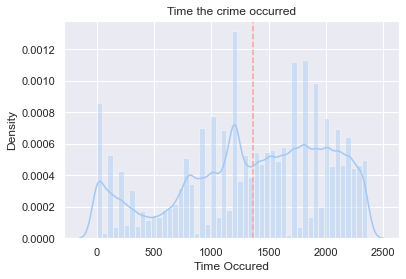

In [16]:
#Create a histogram of the time_occ.
distplot(data["time_occ"],
         x_label = "Time Occured",
         title = "Time the crime occurred",
        mean_ = True)

There is an unusual pattern where a lot of crimes occurred in the first half of each hour. This may be a data entry error by the administration staff, it may be the administration staff making a rounding judgement, or it is more likely to be the victim not precisely knowing the time the crime occurred. This is most likely as it's not the victim's first concern to check the time.

There are also 3 distinct peaks. This would also suggest that the LAPD run their organisation in 3 shift patterns. This may lead to increases in the occurrence of crimes between those shifts however, when police presence is minimised. The level of crime rises steadily in periodic cycles. I cannot say for sure if these are during the end or start of a shift however, as the shift may cross from one day to another. It looks highly likely that there is a systematic problem related to the shift pattern. LAPD may consider overlapping their shifts more to to have a consistent presence on the street.

## Conclusion - Objective 1
The dataset includes some missing values, but this is common of most datasets so is not a major concern. The important variables that did exhibit missing values were *Victim Age* (17.6% had missing values), *Victim Sex* (approximately 10% had missing values), and *Victim Descent* (approximately 10% had missing values).

**Time Occured (time_occ)**<br>
The time the crime occurred is of questionable validity. Whilst we can infer some general trends from this variable - such as large spikes in the middle of the day/early afternoon, and the early evening, I cannot definitively conclude anything more accurate. Some rounding is to be expected as when a crime occurs - especially directly to a person - the victim's first reaction is not to check the time, and hence when questioned they will give an approximation. Further, even if the crime is to property - for example, someone's home - the victim will have to take an approximation of the time as they may have been at work, etc. Therefore, doing any further analysis of the <code>time_occ</code> variable would be questionably useful.

**Data entry errors**<br>
The most obvious data entry error is the observations that include a negative *Victim Age*, which is obviously not possible. Sometimes datasets will use a coding system whereby for example '-1' may represent *refusal to give their age to the officer*, but the minimum age is '-9' which would be an unusual - although not an impossible coding choice. In addition to this the data source's website does not mention any coding scale so I am assume these are data entry errors.

**Overall**<br>
I think the dataset, after cleaning and some observation removal, is useful and completing EDA should lead to some credible inferences to help the LAPD.

# Exploratory Data Analysis
I will organise the EDA as follows:
* Victim Centred
* Area Centred. This is geographical area as defined by LAPD into 21 districts.
* Victim Type Centred. The victim is not always a person, it can also be property, justice, and other types.
* Outcome Centred
* Location Centred: location of the crime independent of the Area. These are locations such as Street, Shop, Hotel, etc, rather than district names.

## Victim Centred
**Victim Descent**<br>
I will do a basic count of the number of crimes for each recorded victim descent. This tells us nothing about what the profile of the victim of any specific crime is, but does tell us overall the descent of the people who were the victims of the most crime overall.

In [17]:
#Create a dictionary of descents.
#Note: I have renamed the original "Hispanic/Latin/Mexican" category as "Hispanic" to improve readability on the graphs.
descents_dict = {"A" : "Other Asian", "B" : "Black", "C" : "Chinese", "D" : "Cambodian", "F": "Filipino", "G": "Guamanian", "H": "Hispanic", "I" : "American Indian/Alaskan Native", "J" : "Japanese", "K" : "Korean", "L": "Laotian", "O": "Other", "P": "Pacific Islander", "S": "Samoan", "U": "Hawaiian", "V": "Vietnamese", "W": "White", "X": "Unknown", "Z": "Asian Indian"}
#Resassign descents from initials to words. This is easier to understand the dataframe without having a crib sheet of initials...
#...it will also improve the readability of the axis labels when I plot the descents.
data["vict_descent"] = data["vict_descent"].map(descents_dict)
data.head()

,date_rptd,date_occ,time_occ,area,area_name,crm_cd,crm_cd_desc,vict_age,vict_sex,vict_descent,premis_desc,status_desc,location,lat,lon,weapon_desc,Year,Month,Day
dr_no,,,,,,,,,,,,,,,,,,,
121513381,2012-06-16,2012-05-23,1513,15,N Hollywood,649,DOCUMENT FORGERY / STOLEN FELONY,35,F,Hispanic,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,5600 LAUREL CANYON BL,34.1722,-118.3965,No weapon used,2012,05,23
101406550,2010-02-09,2010-02-08,1030,14,Pacific,440,THEFT PLAIN - PETTY ($950 & UNDER),25,F,White,SINGLE FAMILY DWELLING,Invest Cont,4300 LYCEUM AV,33.9905,-118.4338,No weapon used,2010,02,08
181504799,2018-01-16,2018-01-15,1830,15,N Hollywood,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",19,F,Hispanic,"VEHICLE, PASSENGER/TRUCK",Invest Cont,5700 CLEON AV,34.1740,-118.3681,No weapon used,2018,01,15
132104062,2013-01-02,2013-01-01,1600,21,Topanga,330,BURGLARY FROM VEHICLE,48,F,White,PARKING LOT,Invest Cont,19700 VENTURA BL,34.1726,-118.5622,No weapon used,2013,01,01
141118912,2014-10-30,2014-09-29,1200,11,Northeast,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),44,F,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,2000 N VERMONT AV,34.1077,-118.2918,No weapon used,2014,09,29


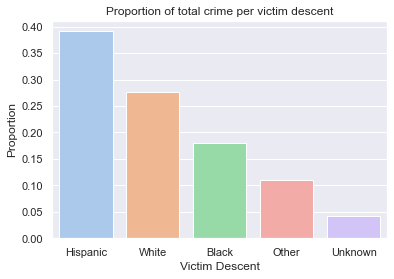

In [18]:
grouped_descent = data.groupby(["vict_descent"]).count()
sorted_descent = grouped_descent.sort_values(["crm_cd"], ascending = False).reset_index()
sorted_descent = sorted_descent.nlargest(5,"crm_cd")

barplot(sorted_descent["vict_descent"],
        sorted_descent["crm_cd"],
        x_label = "Victim Descent",
        title = "Proportion of total crime per victim descent",
        proportions = True,
       rotate = False,
       sup_line = True)

Hispanics are the victims of almost 40% of all crimes, followed by White, and then Black people. We can see from https://www.census.gov/quickfacts/losangelescitycalifornia that Hispanics make up ~48.6% of all LA residents as of 2019. White people make up 28.5%. This suggests that White people are victims of crimes in line with their proportion of the population. Hispanic residents, however, are the victims of crime less than would be expected given their proportion of the population if victims were chosen randomly. A stand out feature of this dataset is that Black people make up ~8.9% of the population in Los Angeles but are the victims of ~18% of crimes. This suggests there is an unfair bias towards Black people being targeted more than would be expected by the proportion of the population that they occupy. I will create a heatmap of the most popular crime to explore this more in an upcoming section.

**Victim Gender**<br>
I will do the same for victim gender. Again this is naive and not crime specific, but gives us an overall view. 

In [19]:
#Create a dictionary of genders.
genders_dict = {"F": "Female", "M" : "Male", "X" : "Unknown"}
#Resassign genders from initials to words. This makes it is easier to understand the dataframe without having a crib sheet of initials...
#...it will also improve the readability of the axis labels when I plot the genders.
data["vict_sex"] = data["vict_sex"].map(genders_dict)
display(data.head())

,date_rptd,date_occ,time_occ,area,area_name,crm_cd,crm_cd_desc,vict_age,vict_sex,vict_descent,premis_desc,status_desc,location,lat,lon,weapon_desc,Year,Month,Day
dr_no,,,,,,,,,,,,,,,,,,,
121513381,2012-06-16,2012-05-23,1513,15,N Hollywood,649,DOCUMENT FORGERY / STOLEN FELONY,35,Female,Hispanic,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,5600 LAUREL CANYON BL,34.1722,-118.3965,No weapon used,2012,05,23
101406550,2010-02-09,2010-02-08,1030,14,Pacific,440,THEFT PLAIN - PETTY ($950 & UNDER),25,Female,White,SINGLE FAMILY DWELLING,Invest Cont,4300 LYCEUM AV,33.9905,-118.4338,No weapon used,2010,02,08
181504799,2018-01-16,2018-01-15,1830,15,N Hollywood,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",19,Female,Hispanic,"VEHICLE, PASSENGER/TRUCK",Invest Cont,5700 CLEON AV,34.1740,-118.3681,No weapon used,2018,01,15
132104062,2013-01-02,2013-01-01,1600,21,Topanga,330,BURGLARY FROM VEHICLE,48,Female,White,PARKING LOT,Invest Cont,19700 VENTURA BL,34.1726,-118.5622,No weapon used,2013,01,01
141118912,2014-10-30,2014-09-29,1200,11,Northeast,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),44,Female,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,2000 N VERMONT AV,34.1077,-118.2918,No weapon used,2014,09,29


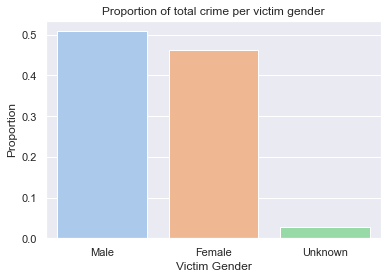

In [20]:
#Group by victim gender and plot in descending order.
grouped_gender = data.groupby(["vict_sex"]).count()
sorted_gender = grouped_gender.sort_values(["crm_cd"], ascending = False).reset_index()

#There are more than 3 genders, but they contribute such a small percentage that their bars are not visible alongside the much larger bars of M, F, X.
#I will remove these. Further, any analysis done on those genders would be questionable as the sample size is so small for those genders.
sorted_gender = sorted_gender.nlargest(3,"crm_cd")

#Create barplot
barplot(x_inputs = sorted_gender["vict_sex"],
        y_inputs = sorted_gender["crm_cd"],
        x_label = "Victim Gender",
        title = "Proportion of total crime per victim gender",
        proportions = True,
        rotate = False,
       sup_line = True)

It is worth noting that we can't easily, even with only 2 variables currently, make any assertions about the victim's profile. Just because Hispanic and Male are the most popular two characteristics, it is not possible to say that Male Hispanics are the victims of most crime. It may be that all of the Hispanic people who were victims of crimes were females, and the ~52% of the victims who were male came from an aggregate of the other descents. We can see even in this small example that the number of possibilities of victim characteristics grows exponentially.

We could look at every possible combination of "Victim age", "Victim Gender", and "Victim Descent" and this would give us the count of each combination and in theory we *could* then describe the typical victim of crime X as Male, Hispanic, aged 32, for example. However, in practice, and especially with our smaller sample, it would lead to very small group sizes in each potential combination. Even if we used the full population of 2.11m crimes I think it would quickly suffer the same problem, given that there are so many ages. We could group ages into bins of say 5 years but deciding on those bin values would be subjective and to gain a robust inference I would have to use a sliding window to try all the possible interval boundaries.

**Victim Age**<br>

The average victim age is:  39


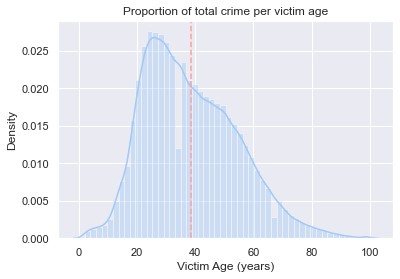

In [21]:
import statistics
print("The average victim age is: ", int(round(statistics.mean(data["vict_age"][data["vict_age"] != 0]),0)))

#We can plot ages to get a feel for the distribution.
distplot(x_inputs = data["vict_age"][data["vict_age"] != 0],
         x_label = "Victim Age (years)",
        title = "Proportion of total crime per victim age",
        mean_ = True)


**Crimes by victim gender**<br>
The previous graph gives us an overview but it does not tell us much about the underlying victim. If LAPD is to focus in on certain crimes then it will be useful to gain an estimate of who is more likely to be a victim of a particular crime.

**Female**<br>
I will subset all of the crimes by gender and plot the most popular crimes for each gender to visualise any differences. First I will subset by Female.

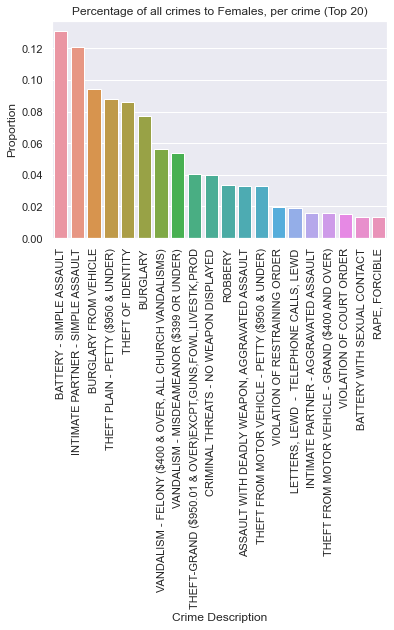

In [22]:
#Only select values that include a victim's sex
crimes_with_gender = data[data["vict_sex"].notna()]

#Subset only the females
crimes_female = crimes_with_gender[crimes_with_gender["vict_sex"] == "Female"]

#Group by crime description and calculate the count for each group
grouped_crimes_female = crimes_female.groupby(["crm_cd_desc"]).count()

#Sort the values into decreasing order
sorted_crimes_female = grouped_crimes_female.sort_values(["crm_cd"], ascending = False).reset_index()

#Subset the 20 most popular so the graph isn't too crowded.
sorted_crimes_female = sorted_crimes_female.nlargest(20,"crm_cd")


barplot(x_inputs = sorted_crimes_female["crm_cd_desc"],
       y_inputs = sorted_crimes_female["vict_age"],
       proportions = True,
       rotate = True,
       x_label = "Crime Description",
       title = "Percentage of all crimes to Females, per crime (Top 20)",
       sup_line = True)

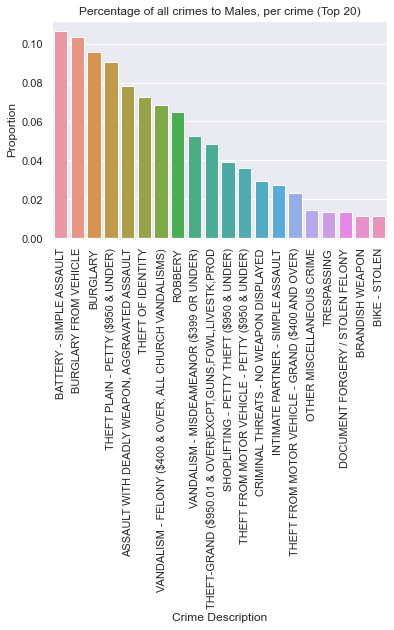

In [23]:
#Only select values that include a victim's sex
crimes_with_gender = data[data["vict_sex"].notna()]

#Subset only the males
crimes_male = crimes_with_gender[crimes_with_gender["vict_sex"] == "Male"]

#Group by crime description and calculate the count for each group
grouped_crimes_male = crimes_male.groupby(["crm_cd_desc"]).count()

#Sort the values into decreasing order
sorted_crimes_male = grouped_crimes_male.sort_values(["crm_cd"], ascending = False).reset_index()

#Subset the 20 most popular so the graph isn't too crowded.
sorted_crimes_male = sorted_crimes_male.nlargest(20,"crm_cd")


barplot(x_inputs = sorted_crimes_male["crm_cd_desc"],
       y_inputs = sorted_crimes_male["vict_age"],
       proportions = True,
       rotate = True,
       x_label = "Crime Description",
       title = "Percentage of all crimes to Males, per crime (Top 20)",
       sup_line = True)

The 3 most popular crimes for females were:
* Battery - Simple Assault
* Intimate Partner - Simple Assault
* Burglary from vehicle

The 3 most popular crimes for males were:
* Battery - Simple Assault
* Burglary from vehicle
* Burglary

Overall we can infer that females are more likely to be the victim of an assault crime, but generally burglary - from either the home or vehicle - is a common problem for Los Angeles on the whole (although this may be concentrated into certain areas).

**Proportion of the top crimes for each gender**<br>
A problem with stacked area graphs is that only the lower most bar has the same initial value (0). Any additional bars have the end value of the previous bar as their starting value. This makes comparison between classes difficult. Given that Male and Female make up a large proportion of the population I will look at the proportion of all crimes where the gender was Male or Female for each crime. As always, I will only use the most popular crimes to avoid the graphs looking cluttered.

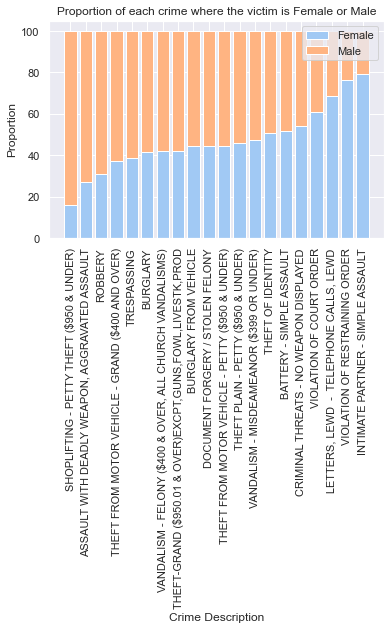

In [24]:
#Only select values that include a victim's sex
crimes_with_gender = data[data["vict_sex"].notna()]

#Subset only the females and males
crimes_fm = crimes_with_gender[crimes_with_gender["vict_sex"].isin(["Male", "Female"])]

#Group by crime description and calculate the count for each group
grouped_crimes_fm = crimes_fm.groupby(["crm_cd_desc", "vict_sex"]).count()

#Split the values along victim sex.
grouped_crimes_fm = grouped_crimes_fm.pivot_table(index = "crm_cd_desc", columns = "vict_sex", values = "date_rptd")

#Fill na values with 0
grouped_crimes_fm = grouped_crimes_fm.fillna(0)

#Create a total column
grouped_crimes_fm["Total"] = grouped_crimes_fm.sum(axis = 1)

#Sort the values into decreasing order
sorted_crimes_fm = grouped_crimes_fm.sort_values(["Total"], ascending = False)

#Subset the 20 most popular so the graph isn't too crowded.
grouped_crimes_fm = sorted_crimes_fm.nlargest(20,"Total")

#Calculate proportions and round values to 2dp
for column in range(2):
    grouped_crimes_fm.iloc[:,column] = round(grouped_crimes_fm.iloc[:, column] / grouped_crimes_fm["Total"] * 100, 2)
    
grouped_crimes_fm = grouped_crimes_fm.reset_index()
grouped_crimes_fm = grouped_crimes_fm.sort_values(["Male"], ascending = False)

stacked(x_inputs = grouped_crimes_fm["crm_cd_desc"],
       y_inputs1 = grouped_crimes_fm["Female"],
       y_inputs2 = grouped_crimes_fm["Male"],
       title = "Proportion of each crime where the victim is Female or Male",
       rotate = True,
       x_label = "Crime Description",
        y_label = "Proportion",
       label1 = "Female",
       label2 = "Male")

If there was no bias towards any victim demographic, then we would expect all crimes to have a 50/50 split between Male and Female. The graph above shows a very different story. On a broad level I would categorise victim's to Females as more often caused by someone known to them and based on intimidation. Whereas, crimes against Males are more related to theft and crimes involving a weapon. This is a subjective oversimplification though. The range is from ~18/82% Female/Male split to a 79/21% split. I could run a hypothesis test to see if these proportions are significantly different, but it is obvious that they are, apart from at incredibly low - and unrealistic - p-values.

**Crimes by Descent**<br>
I will conduct an analogous EDA as the gender one above to see if the proportions change depending on the victim descent. Again, if there was no bias, we would expect the proportions to be 1/#of victim descents. As previously mentioned, stacked bar graphs with more than 2 classes are difficult to accurately interpret. Therefore, I have used a Heatmap to better visualise any differences.

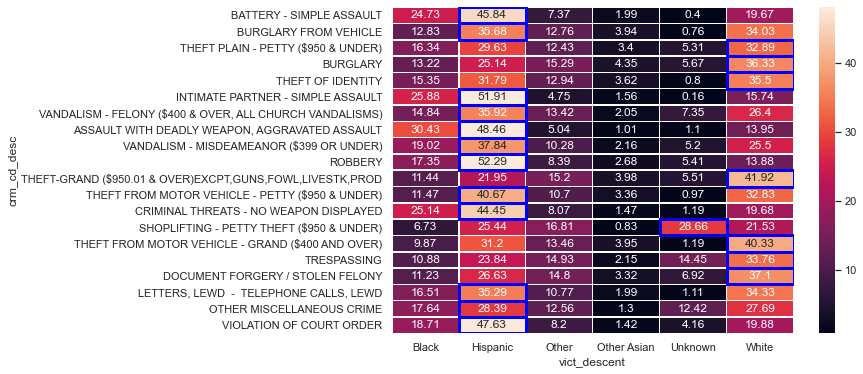

In [25]:
#Group by each crime and then for each crime separate into victim descents.
#This will give me a count for every crime/descent pair.
grouped_crimes_by_descent = data.groupby(["crm_cd_desc", "vict_descent"]).count().reset_index()

#99.2% of all crimes are made up by 6 descents. We can see from a previous graph this visually but later I calculate this explicitly.
#Here I will use that number rather than calculating it a second time for no reason.

#Subset only those 6 most popular victim descents
grouped_crimes_by_descent = grouped_crimes_by_descent[grouped_crimes_by_descent["vict_descent"].isin(["White", "Black", "Hispanic", "Other Asian", "Other", "Unknown"])]

#Create a pivot table
crimes_descent = grouped_crimes_by_descent.pivot_table(index = "crm_cd_desc", columns = "vict_descent", values = "date_rptd")

#Fill na values with 0
crimes_descent = crimes_descent.fillna(0)

crimes_descent["Total"] = crimes_descent.sum(axis =1)

#Sort the values into decreasing order
sorted_crimes_descent = crimes_descent.sort_values(["Total"], ascending = False)

#Subset the 20 most popular so the graph isn't too crowded.
crimes_descent = sorted_crimes_descent.nlargest(20,"Total")

for column in range(crimes_descent.shape[1]):
    crimes_descent.iloc[:,column] = round(crimes_descent.iloc[:, column] / crimes_descent["Total"] * 100, 2)

    
# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(crimes_descent.iloc[:,0:6], annot=True, fmt = "g", linewidths=.5, ax=ax, robust = True);

cdshort = crimes_descent.iloc[:,0:6]
row_max = cdshort.idxmax(axis=1)

#Highlight the maximum value for each row
for row, index in enumerate(cdshort.index):
    position = cdshort.columns.get_loc(row_max[index])
    ax.add_patch(Rectangle((position, row),1,1, fill=False, edgecolor='blue', lw=3))

We can see that for 12 of the top 20 crimes Hispanics were most often the victim (denoted by the blue outline), White people for 7 and Unknown for 1. We cannot say whether there is a bias however as we do not know the exact proportions of the population in Los Angeles for each of these descent classes. Further, even if we did know this information it would still be a questionable calculation as the demographics may have changed substantially over the 10 years of this dataset. Therefore, if we hypothesised about any bias when using the demographic at any particular point in time we would have to make the assumption that this demographic did not change for 10 years. This is to say that the proportion of the total population made up by each of these descents was static. I have no information to comment on whether this is an unrealistic assumption, however.

We can, without the need to demographic data, look at the column data though. For example, if we look at Hispanics versus Black. A Black person is almost equally likely to get robbed as they are to get burgled. However, a Hispanic person is twice as likely to be robbed than burgled.

**Common combinations of variables**<br>
I can attempt to profile the victims to gauge who is the *typical victim* of each crime, but age may cause me some problems as there are so many unique values.

In [26]:
#Calculate all combinations of Victim Sex, Victim Descent, and Crime Description
#These are absolute values but I will use them to calculate the proportions after.
common_combinations = data.groupby(["crm_cd_desc","vict_sex", "vict_descent"])["date_rptd"].count().reset_index()
common_combinations = common_combinations.sort_values(["date_rptd"], ascending = False)

#Rename the columns
common_combinations = common_combinations.rename(columns = {"crm_cd_desc" : "Crime Description", "date_rptd": "Count", "vict_descent" : "Victim Descent", "vict_sex" : "Victim Gender"})
common_combinations.to_csv("Common_Combinations.csv", sep = ",", index = False)
display(common_combinations)

,Crime Description,Victim Gender,Victim Descent,Count
855,INTIMATE PARTNER - SIMPLE ASSAULT,Female,Hispanic,8877
80,BATTERY - SIMPLE ASSAULT,Female,Hispanic,8267
95,BATTERY - SIMPLE ASSAULT,Male,Hispanic,7741
44,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",Male,Hispanic,6244
290,BURGLARY,Male,White,6044
...,...,...,...,...
941,LEWD/LASCIVIOUS ACTS WITH CHILD,Male,Other Asian,1
939,LEWD/LASCIVIOUS ACTS WITH CHILD,Male,Black,1
935,LEWD/LASCIVIOUS ACTS WITH CHILD,Female,Guamanian,1
931,LEWD CONDUCT,Male,Unknown,1


Hispanic Females are the most likely to be the victim of "Intimate Partner - Simple Assault" crimes, as well as "Battery - Simple Assault". We can also notice that the victim descent of the next two most popular pairings are also Hispanic - although this time Male. From first glance we can infer that Hispanics are the most likely victim of assault crimes. Again, it would be ideal to work in proportions rather than absolute values, however, this is not possible in this case. The ideal would be to see what proportion of "Intimate Partner - Simple Assault", for example, was allocated to each combination of Victim Sex, Victim Descent, but without knowing the actual proportions of those combinations in the wider society of Los Angeles it is impossible. The reason being that running it without those numbers as comparison means even if we find that Hispanic Females make up X% of all "Intimate Partner - Simple Assault" crimes then I cannot infer if that is exceptionally high or low as it may be that Hispanic Females make up X% of all people and hence their proportion of "Intimate Partner - Simple Assault" is in line with random chance.

**Conclusion - Victim Centred**<br>
**Limitations**<br>
As previously mentioned the Victim Centred approach is limited due to the inability to see the day-by-day demographic make-up of the population. We saw that as of the demographics in 2019 that Hispanics were the victims of crimes less than would be expected (~40% versus their proportion of the population at ~48%). White descent people were the victim of crime as much as would be expected give their proportion in the population. Whilst we do not have the demographic data, the gap between the proportion of Black descent people in the population (8.9%) and their proportion of the crimes (18%) this is a large difference so on the assumption there hasn't been any major shifts in the demographics of Los Angeles we could say that there is a bias towards the victim being Black. It is not a robust conclusion, but it would be more valid than to make the same proposition about any of the other victim descents as the differences between population make-up and proportion of crimes is much closer.

Overall, we can see that any inference where we are looking for bias outside of the sample, such as "is group X more targeted than would be expected under random probability?", are not possible without full demographic information from all of Los Angeles - including those who were not victims of crimes. What we *can* do is in-sample comparisons where we treat our sample as the population and conduct inference based on "given that the person was a victim of crime, is any bias present".

**Victim Age**<br>
There is a pronounced positive skew on the Victim Age graph with the mode being around the mid twenties and the mean at 39. Again more robust analysis would require us to gather age demographic data for many more time periods during the 10 year dataset timespan. This is a limitation of this study.

**Victim Gender**<br>
There is a pronounced difference in the proportion of the genders for specific crimes (<code>grouped_crimes_fm</code>). From the initial analysis we saw that approximately 52% of the population was Male and approximately 45% was female - a relatively even split. However, when looking at the gender of the victim on a crime-by-crime basis the top 20 crimes vary from 15.87% Female versus 84.13% Male for *Shoplifting - Petty Theft* to  79.32% Female versus 20.68% Male for *Intimate Partner - Simple Assault*.

This leads me to believe that criminals are conciouslly targeting specific genders for particular crimes, i.e. when going out to commit a robbery the victim is much more likely to be Male. I can't comment on the reasons but given that the criminal wants to increase their chances they likely have a mental checklist of ideal characteristics of a victim for each crime.

## Area Centred
LAPD has divided the whole of Los Angeles into 21 districts that it calls "areas". These areas have different populations and therefore to compare them equally I will need to standardize the data. First, I will plot graphs for the unstandardized data to more clearly make the point of why standardization is important to accurately represent the underlying findings using visualisations.

LAPD Division Areas taken from: https://en.wikipedia.org/wiki/Los_Angeles_Police_Department
Population data for each of those area taken from: https://www.lapdonline.org. Most areas had an "About X" page, such as this one for 77th Street: https://www.lapdonline.org/77th_street_community_police_station/content_basic_view/1573. Topanga had no details about their population on the LAPD website so the source was: https://en.wikipedia.org/wiki/Topanga,_California which used the 2010 census. All populations rounded to the nearest 1000. Olympica had no LAPD webpage, so I used this source: https://en.wikipedia.org/wiki/Los_Angeles_Police_Department.

In [27]:
area = [{"Name" : "Central Area", "Area number": 1, "Bureau" :"Central Bureau", "Population": 40000},
        {"Name" : "Hollenbeck Area", "Area number": 4 , "Bureau" :"Central Bureau", "Population": 200000},
        {"Name" : "Newton Area", "Area number": 13, "Bureau" :"Central Bureau", "Population": 150000},
        {"Name" : "Northeast Area", "Area number": 11, "Bureau" :"Central Bureau", "Population": 250000},
        {"Name" : "Rampart Area", "Area number": 2, "Bureau" :"Central Bureau", "Population": 165000},
        {"Name" : "77th Street Area", "Area number": 12, "Bureau" :"South Bureau", "Population":175000},
        {"Name" : "Harbor Area", "Area number": 5 , "Bureau" :"South Bureau", "Population": 171000},
        {"Name" : "Southeast Area", "Area number": 18, "Bureau" :"South Bureau", "Population": 150000},
        {"Name" : "Southwest Area", "Area number": 3, "Bureau" :"South Bureau", "Population": 165000},
        
        {"Name" : "Devonshire Area", "Area number": 17, "Bureau" :"Valley Bureau", "Population": 220000},
        {"Name" : "Foothill Area", "Area number": 16, "Bureau" :"Valley Bureau", "Population": 182000},
        {"Name" : "Mission Area", "Area number": 19, "Bureau" :"Valley Bureau", "Population": 226000},
        {"Name" : "North Hollywood Area", "Area number": 15, "Bureau" :"Valley Bureau", "Population": 220000},
        {"Name" : "Van Nuys Area", "Area number": 9 , "Bureau" :"Valley Bureau", "Population": 325000},
        {"Name" : "West Valley Area", "Area number": 10, "Bureau" :"Valley Bureau", "Population": 197000},
        {"Name" : "Topanga Area", "Area number": 21, "Bureau" :"Valley Bureau", "Population": 7500},
        
        {"Name" : "Hollywood Area", "Area number": 6, "Bureau" :"West Bureau", "Population": 300000},
        {"Name" : "Olympic Area", "Area number": 20, "Bureau" :"West Bureau", "Population": 200000},
        {"Name" : "Pacific Area", "Area number": 14, "Bureau" :"West Bureau", "Population":200000},
        {"Name" : "West Los Angeles Area", "Area number": 8, "Bureau" :"West Bureau", "Population": 228000},
        {"Name" : "Wilshire Area", "Area number": 7, "Bureau" :"West Bureau", "Population": 251000},
       ]

area_desc = pd.DataFrame(data = None)
area_desc = area_desc.append(area, ignore_index = True)
area_desc = area_desc.sort_values(["Area number"], ascending = True)

pd.options.display.float_format = '{:.0f}'.format

sorted_area = data.groupby(["area"])["date_rptd"].count().tolist()
sorted_area = np.asarray(sorted_area)
area_desc["Observed Crimes"] = sorted_area

#area_desc["Per Capita"] = area_desc["Observed Crimes"] / area_desc["Population"] *10000
total_pop = sum(area_desc["Population"])
total_crime = sum(area_desc["Observed Crimes"])

area_desc["Expected Crime"] = area_desc["Population"]/total_pop * total_crime

display(area_desc.head())

,Name,Area number,Bureau,Population,Observed Crimes,Expected Crime
0,Central Area,1,Central Bureau,40000,17923,3877
4,Rampart Area,2,Central Bureau,165000,16429,15992
8,Southwest Area,3,South Bureau,165000,24869,15992
1,Hollenbeck Area,4,Central Bureau,200000,14341,19385
6,Harbor Area,5,South Bureau,171000,17018,16574


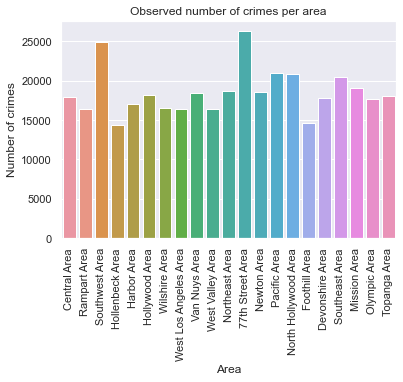

In [28]:
#Group by the crime area, count up the number of crimes at each of those locations.
#grouped_area = area_desc.groupby(["Name"]).count()
#sorted_area = grouped_area.sort_values(["crm_cd"], ascending = False).reset_index()

barplot(x_inputs = area_desc["Name"],
        y_inputs = area_desc["Observed Crimes"],
        x_label = "Area",
        title = "Observed number of crimes per area",
        proportions = False,
       rotate = True,
       sup_line = True)

**Crimes in area proportional to population**<br>
We can naively expect that areas with more people will have more crime, however, we need to calculate this objectively. Therefore, I will look at the actual crime that occurred in each area in relation to their population.

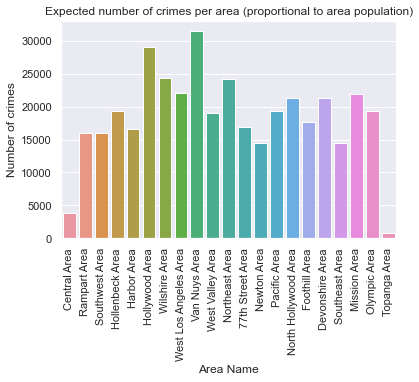

In [29]:
barplot(x_inputs = area_desc["Name"],
       y_inputs = area_desc["Expected Crime"],
       x_label = "Area Name",
       title = "Expected number of crimes per area (proportional to area population)",
       proportions = False,
       rotate = True,
       sup_line = True)

I calculated the expected level of crime by first calculating the percentage of the total population of Los Angeles that resides in each area. I multiplied this proportion by the total crime count of Los Angeles to estimate how much crime I expected in each area, relative to that area's population.

To see the underlying pattern more clearly we will create a new column for the difference. Those with a positive difference have had more crime than expected, and vice versa.

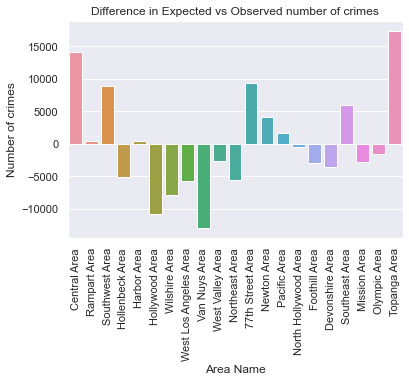

In [30]:
area_desc["Difference"] = area_desc["Observed Crimes"] - area_desc["Expected Crime"]

barplot(x_inputs = area_desc["Name"],
       y_inputs = area_desc["Difference"],
       x_label = "Area Name",
        title = "Difference in Expected vs Observed number of crimes",
       proportions = False,
       rotate = True,
       sup_line = True)

**Standardized Crimes in Area**<br>
When we look at the ratio of Observed to Expected number of crimes we can see a much more obvious problem. Central Area and Topanga Area have vastly more crimes than expected given their population size. Topanga especially has ~25 times more crime than would be expected for an area of its size. On the previous graph we also saw large positive deviations from expectation for Southwest Area, 77th Street Area, Newton Area, and Southeast Area. The standardized graph tells us the areas we should be worried about the most when considering all areas. However, this is not much comfort for those living in the areas mentioned above as when looking at the standardized graph those people would be fed the line "you may think your area is bad, but least you don't live in Topanga or Central", which is of little consolation to those residents.

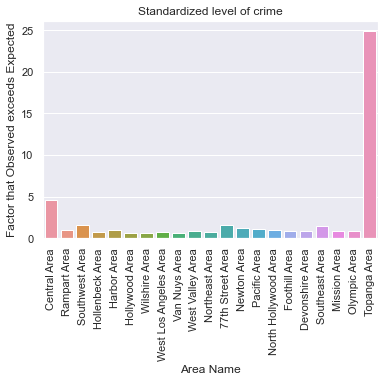

In [31]:
area_desc["Standardized"] = area_desc["Observed Crimes"] / area_desc["Expected Crime"]

barplot(x_inputs = area_desc["Name"],
       y_inputs = area_desc["Standardized"],
       x_label = "Area Name",
        title = "Standardized level of crime",
       proportions = False,
       rotate = True,
       y_label = "Factor that Observed exceeds Expected",
       sup_line = True)

**Conclusion - Area Centred**<br>
Using the standardized graph we can see more clearly that Central Area and Topanga Area are the areas of highest concern for LAPD. However, I have not considered the severity of crimes. I am unable to objectively say that X number of crime A is equal in severity to for example, 1 murder, but I have to be aware of this limitation in the above standardized graph. It may be that Central Area and Topanga Area have higher than expected levels of crime for their population, but if all of those crimes are small value property crimes with no physical victim contact then LAPD may prefer to divert their attention to areas with less, but more severe crimes. In an ideal world we would attempt to deter all crimes, but this is not feasible with a limited size police force and funding. I attempted to group crimes by their severity but came across 2 problems:
1. There was a large number of the 137 crimes that I could not explicitly find a severity level for. I do not have the specialist knowledge to make a judgement call and felt that it may skew the results too much.
2. Severity levels were, in my personal opinion, too broad (encompassing a wide array of crimes) and did not address the point about of how to judge if 1 of crime A is equal to 1 of crime B.

This led to only a partially categorised dataset. Although as it did not give us enough granular detail as the categories were so broad I would not have been able to make any useful interpretation even if I were able to catergorise it fully. 

**Information availability and limitations**<br>
I tried to collate the *area* populations from the same source - the LAPD website - but this was not always possible. Therefore, I must mention that there may be discrepancies in these numbers as we cannot be sure of the rigor of these multiple websites that I needed to use. Each of these websites may have used different sampling methods to calculate the population, and it is likely they did not all make the approximation on the same day. For example, website A may have had accurate results 6 months ago - which could be their most recent result and the one published on their site, but website B may have made an equally accurate result much more recently. No site explicitly said how they collected the data, or what time period the data referred too.

Further to this, even if we assume that all population data was collected with the same rigor and on the same date, it does not address the issue that the dataset spans 10 years. Our conclusion that Central Area and Topanga Area experienced vastly more crime than expected may not have held during the whole 10 year period, in which the population size will have changed. For example, Topanga Area may have had, at a period between 2010-2019, a large population. During this time, we could assume that a large number of crimes happened. This is a fair assumption as criminals may be motivated to move to areas with large populations - and for them, more potential victims. Then now assume that Topanga Area's population suddenly dropped. This would lead to a large crime count being distributed over the most recent population estimate - which is now small due to the drop. The same is converse in areas that had small populations and small crime which then became suddenly more densely populated and had that low crime number spread very thinly over a large population. This would give the false impression that that area had always been an area of very low crime, which would not be the case.

The only completely accurate way to complete the Area Centred analysis would be to use a more frequent population count. This would then mean I could calculate the same ratios as above, for each period (monthly, if monthly population data was available) and then average them for each area and standardize as above.

I believe this is a common problem for datasets that span such a long time period, but do not have the population data available also. The similar could be said for, for example, the victim's age. If the demographics of Los Angeles were much older in 2010, and between 2011-2019 a vast amount of younger people moved to LA then when taking the average over the whole dataset it would look like the average victim age in 2010 was the same as in 2019 - which we can't conclusively say is true.

**Extensions**<br>
Central Area has a high commuter to resident ratio. I would have liked to look at whether crime rises during the working week as it potentially signals that commuters are the victims and that local residents are less of a target. This should increase residents' feeling of safety. This would also explain why Central Area has a much greater standardized level of crime than would be expected given it's population.

# Victim Type Centred
Crimes are categorised into either *Offence against the person*, *Sexual Offences*, *Crimes against property*, *Crimes against justice*, *Crimes against the public*, *Crimes against animals*, or *Crimes against the state*. I will use the definitions from Wikipedia: https://en.wikipedia.org/wiki/Felony to assign each crime in our dataset to one of those classes.

It will be interesting to explore whether the type of crime has changed over time. Perhaps a change in the level of policing has led to less crimes being committed against a person and more crimes being committed against property. I do not have access to any data about the level or type of policing available on each day so I am unable to conclude *why* any change has occurred - if indeed any has occurred - but LAPD should be able to cross reference my graphs with their data.

In [32]:
#Create a list of unique crime descriptions and save this to a .csv
crime_list = data.crm_cd_desc.unique()
crime_list_df = pd.DataFrame(crime_list)
#print(len(crime_list)) #Print length so we know in future if we have included every crime. #137 Crimes

#Display the dataframe to check the function worked
display(crime_list_df.head())

#Save to a new .csv
crime_list_df.to_csv("Crime_List.csv", sep = ",", index = False)
#I then, outside of this script, assigned each of these crimes to one of the aforementioned classes, and then read back in the new .csv for analysis.

,0
0,DOCUMENT FORGERY / STOLEN FELONY
1,THEFT PLAIN - PETTY ($950 & UNDER)
2,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA..."
3,BURGLARY FROM VEHICLE
4,VANDALISM - MISDEAMEANOR ($399 OR UNDER)


In [33]:
#I renamed the .csv after annotation and will read in the new annotated one.
crime_annotated = pd.read_csv("Crime_List_Annotated.csv", sep = ",")
crime_annotated = crime_annotated.rename(columns = {"Unnamed: 0": "X", "0": "Crime","Victim Type": "Victim Type"})
crime_annotated = crime_annotated.drop(columns = ("X"))

display(crime_annotated.head())

,Crime,Victim Type
0,BURGLARY FROM VEHICLE,Property
1,BATTERY - SIMPLE ASSAULT,Person
2,OTHER MISCELLANEOUS CRIME,NaN
3,SEXUAL PENETRATION W/FOREIGN OBJECT,Sexual Offences
4,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",Property


I will add a new column to the full dataset and then map the values from the dictionary <code>crime_types</code> to the dataframe <code>data</code>

In [34]:
#Convert the Crime column to a dict
crime_types = dict(zip(crime_annotated.Crime, crime_annotated["Victim Type"]))
data["Victim Type"] = data["crm_cd_desc"].map(crime_types)
data.head()

,date_rptd,date_occ,time_occ,area,area_name,crm_cd,crm_cd_desc,vict_age,vict_sex,vict_descent,premis_desc,status_desc,location,lat,lon,weapon_desc,Year,Month,Day,Victim Type
dr_no,,,,,,,,,,,,,,,,,,,,
121513381,2012-06-16,2012-05-23,1513,15,N Hollywood,649,DOCUMENT FORGERY / STOLEN FELONY,35,Female,Hispanic,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,5600 LAUREL CANYON BL,34,-118,No weapon used,2012,05,23,Property
101406550,2010-02-09,2010-02-08,1030,14,Pacific,440,THEFT PLAIN - PETTY ($950 & UNDER),25,Female,White,SINGLE FAMILY DWELLING,Invest Cont,4300 LYCEUM AV,34,-118,No weapon used,2010,02,08,Property
181504799,2018-01-16,2018-01-15,1830,15,N Hollywood,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",19,Female,Hispanic,"VEHICLE, PASSENGER/TRUCK",Invest Cont,5700 CLEON AV,34,-118,No weapon used,2018,01,15,Property
132104062,2013-01-02,2013-01-01,1600,21,Topanga,330,BURGLARY FROM VEHICLE,48,Female,White,PARKING LOT,Invest Cont,19700 VENTURA BL,34,-119,No weapon used,2013,01,01,Property
141118912,2014-10-30,2014-09-29,1200,11,Northeast,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),44,Female,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,2000 N VERMONT AV,34,-118,No weapon used,2014,09,29,Property


I will create a basic histogram plot to see the proportion of each <code>Victim Type</code>.

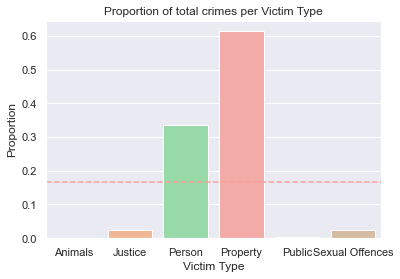

The horizontal line represents the expected proportion of Victim Types if all were equally likely.


In [35]:
#Group by Victim Type
grouped_victim_type = data.groupby(["Victim Type"])["date_rptd"].count().reset_index()
# Selecting any remaining column achieves the goal of displaying the counts of Victim Type as the count in every column...
#...is the same across the whole row.
barplot(x_inputs = grouped_victim_type["Victim Type"],
        y_inputs = grouped_victim_type["date_rptd"],
        x_label = "Victim Type",
        title = "Proportion of total crimes per Victim Type",
        proportions = True,
        rotate = False)
print("The horizontal line represents the expected proportion of Victim Types if all were equally likely.")

*Offences against Property* and *Offences against the Person* account for the vast majority of crimes. I do not find this surprising. However, as with all the other preliminary plots we have made, an aggregate does not give us a lot of useful information. Therefore, I will group by day, and then by *Victim Type*, then plot a line graph to see if the proportion has changed over time. This will tell us if any class of crime is becoming more or less popular. The red dotted line represents the proportion at which we would expect each category of *Victim Type* to occur if there were no preference by the criminals. We can see how much *Person* and *Property* are above this line, which may give LAPD some idea of the criminal's preferences.

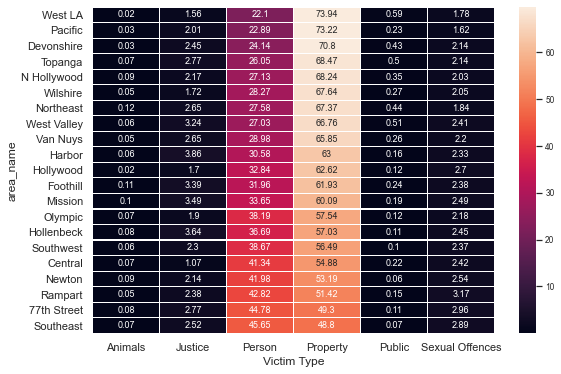

In [36]:
grouped_area_type = data.groupby(["area_name", "Victim Type"])["date_rptd"].count().reset_index()
grouped_area_type_long = grouped_area_type.pivot_table(index = "area_name", columns = "Victim Type", values = "date_rptd").T
grouped_area_long = (grouped_area_type_long / grouped_area_type_long.sum())

#This line does a couple of things: Transpose the dataframe, sort by "Property", and then round to 2 decimal places.
#...previously this has been done on multiple lines to help with readability, but I have included it here as an alternative format to show it can be done.
grouped_area_long = round(grouped_area_long.T.sort_values(["Property"], ascending = False)*100,2)

#Print dataframe to check it's working.
#display(grouped_area_long.head())

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(9, 6))
sns.set(font_scale = .75)
sns.heatmap(grouped_area_long, annot=True, fmt = "g", linewidths=0.1, robust = True);

Immediately we can see that Sexual Offences are no more or less likely in one area versus another. The majority of crimes are against people or property. Here we can see there is a large shift in the split between those categories depending on the area. West LA has the largest amount of property crime whereas Southeast has ~25% less property crime, but almost all of that decrease is now shifted to crimes against people. I did look at the district map for Los Angeles to see if a divide was present that was similar to that of the heatmap. I was interested to see if whether all of those districts that had high *Crimes against Property* were grouped together geographically, but this was not the case. Neither was it the case for other Victim Types.

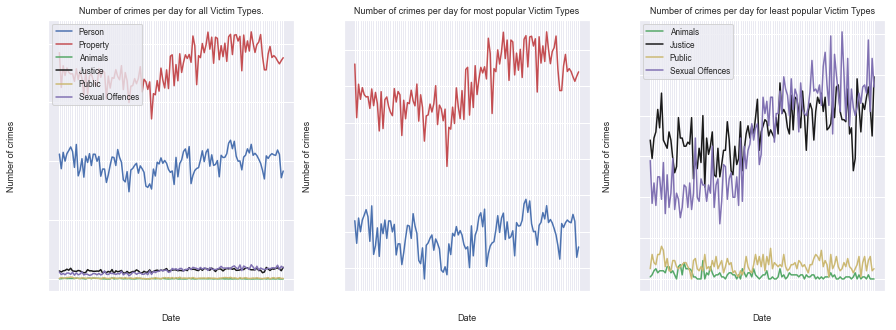

In [37]:
grouped_date = data.groupby(["Year", "Month","Victim Type"])["area"].count().reset_index()

#Pivot the data to get seperate columns for each of our Victim Types
grouped_date = grouped_date.pivot(index = ["Year", "Month"], columns = "Victim Type", values = "area").reset_index()
#print(grouped_date.shape) #This is expected as the dataset has 12 months and 10 years, making 120 Year/Month pairs.
grouped_date = grouped_date.fillna(0)

grouped_date['date'] = grouped_date['Month'].map(str)+ '-' +grouped_date['Year'].map(str)
grouped_date['date'] = pd.to_datetime(grouped_date['date'], format='%m-%Y').dt.strftime('%m-%Y')
fig, (ax1, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize = (15,5))
ax1.plot(grouped_date['date'], grouped_date['Person'],'b',label = "Person")
ax1.plot(grouped_date['date'], grouped_date['Property'],'r', label = "Property")
ax1.plot(grouped_date['date'], grouped_date['Animals'], 'g', label = "Animals")
ax1.plot(grouped_date['date'], grouped_date['Justice'], 'k', label = "Justice")
ax1.plot(grouped_date['date'], grouped_date['Public'], 'y', label = "Public")
ax1.plot(grouped_date['date'], grouped_date['Sexual Offences'], 'm', label = "Sexual Offences")
ax1.set_title("Number of crimes per day for all Victim Types.")
ax1.set_xlabel("Date")
ax1.set_ylabel("Number of crimes")
ax1.legend(loc = 2)
ax1.tick_params(colors = "w")

#This graph includes all Victim Types. This is useful but as Property and Person have such large values it makes viewing the other categories difficult.
#I will split the graphs into "Property and Person" and a separate one for the remaining categories.

ax2.plot(grouped_date['date'], grouped_date['Person'], 'b', label = "Person")
ax2.plot(grouped_date['date'], grouped_date['Property'], 'r', label = "Property")
ax2.set_title("Number of crimes per day for most popular Victim Types")
ax2.set_xlabel("Date")
ax2.set_ylabel("Number of crimes")
ax2.tick_params(colors = "w")

ax3.plot(grouped_date['date'], grouped_date['Animals'],'g', label = "Animals")
ax3.plot(grouped_date['date'], grouped_date['Justice'], 'k', label = "Justice")
ax3.plot(grouped_date['date'], grouped_date['Public'], 'y', label = "Public")
ax3.plot(grouped_date['date'], grouped_date['Sexual Offences'], 'm', label = "Sexual Offences")
ax3.legend(loc = 2)
ax3.set_title("Number of crimes per day for least popular Victim Types")
ax3.set_xlabel("Date")
ax3.set_ylabel("Number of crimes")
ax3.tick_params(colors = "w")
plt.show()

The first graph is only useful for the *Person* and *Property* categories as the values of the other categories are overshadowed by the large values of *Person* and *Property*, so I separated the values into graphs 2 and 3. Graph 2 shows a similar story to graph 1, whereby the crimes against a person follow a cyclical pattern but there is no obvious changing trend, either up or down. There is a cyclicality to the crimes against property but there is also an upward trend - most pronounced after 2015 that suggests crimes against property are increasing. In graph 3 we can see a clear increase in the number of sexual offences. Crimes against animals, crimes against the public, and crimes against justice do not have a noticeable increase. These graphs tell us the story in absolute terms but they do not easily tells us the story in relational terms. The increases in sexual offences and crimes against property may be due to an increase in population. To infer whether there is a change in the mindset of the criminals - and whether their preferred type of crime has changed I will plot a graph including each datapoint as a proportion of all crimes on that date, for all dates.

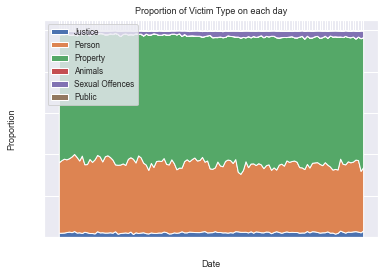

In [38]:
grouped_date = data.groupby(["Year", "Month","Victim Type"])["area"].count().reset_index()

#Pivot the data to get seperate columns for each of our Victim Types
pivot_date = grouped_date.pivot(index = ["Year", "Month"], columns = "Victim Type", values = "area").reset_index()
#display(pivot_date.head())

#Fill empty values with 0
complete_date = pivot_date.fillna(0)

#Create a total column by summing along the row
complete_date["Total"] = complete_date.iloc[:,2:8].sum(axis = 1)
#print(complete_date)

#Calculate proportion of row for each cell
for column in range(2,complete_date.shape[1]-1):
    complete_date.iloc[:,column] = round(complete_date.iloc[:, column] / complete_date["Total"] * 100, 4)

complete_date['date'] = complete_date['Month'].map(str)+ '-' +complete_date['Year'].map(str)
complete_date['date'] = pd.to_datetime(complete_date['date'], format='%m-%Y').dt.strftime('%m-%Y')

plot = plt.stackplot(complete_date["date"], [complete_date["Justice"],
                                      complete_date["Person"],
                                      complete_date["Property"],
                                      complete_date["Animals"],
                                      complete_date["Sexual Offences"],
                                      complete_date["Public"]
                                     ]
                                    )
plt.xlabel("Date")
plt.ylabel("Proportion")
plt.tick_params(colors = "w")
plt.title("Proportion of Victim Type on each day")
plt.legend([plot[0], plot[1], plot[2], plot[3], plot[4], plot[5]],
           labels = ["Justice", "Person", "Property", "Animals", "Sexual Offences", "Public"], loc = 2)
plt.show()


**Conclusion - Victim Type Centred**<br>
Both *Crimes against Property* and *Crimes against Person* exhibit a cyclicality that the other types do not. We can see that over time *Sexual Offences* increased as a proportion of total crime.

It is also evident that each Area is characterised by a different Victim Type. Areas such as West LA and Pacific have considerably more *Crimes against Property* than areas such as 77th Street and South East. An extension of this project would be to look at the values of property in those areas and cross reference that with the level of *Crimes against Property* in those areas. There is an argument to say that richer areas would be more of a target of property crime, but equally there is the argument that wealthier households are more likely to have better security - and hence deter criminals, and thus we'd expect a lower level of property crime.

**Limitations**<br>
It must be noted that some of the crime descriptions were not detailed enough to make an explicit categorisation - such as "Other Miscellaneous Crime" and these were omitted.

**LAPD Spending Suggestion**<br>
Los Angeles seems to have a changing crime scene that is becoming more sexualised. Further to this there is a divergence of Victim Types depending on the area, which is pronounced. LAPD should be able to use this information to more appropriately inform their citizens. If LAPD know that *Crimes against Property* are 50% more likely in West LA than in South East then they can encourage people in West LA to take different precautions than those in South East. For example LAPD could finance better home security for West LA residents and also finance personal protection alarms for those citizens in South East - where *Crimes against the Person* are more common. This precise spending of funds will be more efficient than giving both solutions to both sets of citizens - and hence save LAPD money.

## Outcome Centred
**Outcome of Crimes - General**<br>
I will <code>groupby</code> crime (using Crime Description - crm_cd_desc) and then display the outcome of each crime (whether or not a person was arrested). From there I will be able to see which crime has the highest arrest rate, which I will plot for the top 20 crimes. This will allow LAPD to see where their efforts may be best placed. Crimes with low arrest rates should be focussed on. If criminals start to realise that certain crimes rarely lead to arrests then they may shift their efforts to committing more of those crimes.

status_desc,Invest Cont,UNK,Arrested,Other,Total Crimes,Proportion Arrested,Proportion Unknown,Proportion Continuing,Proportion of Total Crimes
crm_cd_desc,,,,,,,,,
ABORTION/ILLEGAL,1,0,0,0,1,0,0,100,0
ARSON,638,0,22,4,664,3,0,96,0
ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER,122,0,163,28,313,52,0,39,0
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",10062,0,4241,2815,17118,25,0,59,4
ATTEMPTED ROBBERY,1531,0,485,177,2193,22,0,70,1


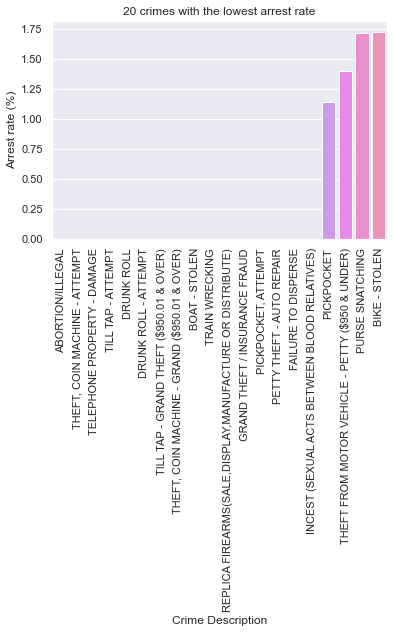

In [39]:
grouped_outcome = data.copy()

grouped_outcome = grouped_outcome.groupby(["crm_cd_desc", "status_desc"])["date_rptd"].count()
grouped_outcome = pd.DataFrame(grouped_outcome).reset_index().set_index("crm_cd_desc")
grouped_outcome_long = grouped_outcome.pivot(columns = ["status_desc"], values = "date_rptd")
grouped_outcome_long = grouped_outcome_long.fillna(0) #Replace all NaN with 0 so we don't get math errors, and it looks tidier.

#I am not interested in who was arrested, just the fact that someone was arrested. Therefore, we can sum the "Adult Arrest" and "Juv Arrest" together...
#...as well as summing "Adult Other" and "Juv Other".
grouped_outcome_long["Arrested"] = grouped_outcome_long["Adult Arrest"] + grouped_outcome_long["Juv Arrest"]
grouped_outcome_long["Other"] = grouped_outcome_long["Adult Other"] + grouped_outcome_long["Juv Other"]
#Drop the columns used to do the sum to save memory.
grouped_outcome_long = grouped_outcome_long.drop(columns = ["Adult Arrest", "Adult Other", "Juv Arrest", "Juv Other"])


#To calculate the proportionality of each outcome we need the totals for each crime, we can use numpy.sum() along the axis = 1 (row) to calculate this.
grouped_outcome_long["Total Crimes"] = np.sum(grouped_outcome_long, axis = 1)

for row in (1,len(grouped_outcome_long)):
    #Calculate the proportion arrested and round to 2dp
    grouped_outcome_long["Proportion Arrested"] = round((grouped_outcome_long["Arrested"] / grouped_outcome_long["Total Crimes"]) * 100,2)
    grouped_outcome_long["Proportion Unknown"] = round((grouped_outcome_long["UNK"] / grouped_outcome_long["Total Crimes"]) * 100,2)
    grouped_outcome_long["Proportion Continuing"] = round((grouped_outcome_long["Invest Cont"] / grouped_outcome_long["Total Crimes"]) * 100,2)
    grouped_outcome_long["Proportion of Total Crimes"] = round(grouped_outcome_long["Total Crimes"] / np.sum(grouped_outcome_long["Total Crimes"], axis = 0)* 100,2)
      
display(grouped_outcome_long.head())

sorted_crimes_outcome = grouped_outcome_long.sort_values(["Proportion Arrested"], ascending = True).reset_index()

#Create a csv before I subset only the top 20.
sorted_crimes_outcome.to_csv("CrimeOutcomes.csv", sep = ",", index = False)

sorted_crimes_outcome = sorted_crimes_outcome.nsmallest(20,"Proportion Arrested")

barplot(x_inputs = sorted_crimes_outcome["crm_cd_desc"],
       y_inputs = sorted_crimes_outcome["Proportion Arrested"],
       x_label = "Crime Description",
        title = "20 crimes with the lowest arrest rate",
       proportions = False,
       rotate = True,
       y_label = "Arrest rate (%)",
       sup_line = True)

Some crimes have a 0% arrest rate, which may be due to small sample sizes. Crimes such as "Till tap", "Train wrecking", and "Boat - Stolen" are possibly low incidence crimes. Whilst it is useful to know that those crimes rarely go unpunished, I don't think it's a priority for LAPD compared to focussing on crimes that affect more people. Firstly, we can look to see the sample size for these crimes with a 0% arrest rate. If this is sufficiently low then I will disregard them from now on.

In [40]:
zero_arrests = grouped_outcome_long[grouped_outcome_long["Proportion Arrested"] == 0]
display(zero_arrests.head())
print("There are", np.sum(zero_arrests["Total Crimes"], axis = 0), "crimes with no arrests")
print("This is", round(np.sum(zero_arrests["Total Crimes"], axis = 0) / len(data) * 100, 5), "% of all crimes")

status_desc,Invest Cont,UNK,Arrested,Other,Total Crimes,Proportion Arrested,Proportion Unknown,Proportion Continuing,Proportion of Total Crimes
crm_cd_desc,,,,,,,,,
ABORTION/ILLEGAL,1,0,0,0,1,0,0,100,0
BOAT - STOLEN,33,0,0,0,33,0,0,100,0
DRUNK ROLL,10,0,0,1,11,0,0,91,0
DRUNK ROLL - ATTEMPT,1,0,0,0,1,0,0,100,0
FAILURE TO DISPERSE,6,0,0,0,6,0,0,100,0


There are 108.0 crimes with no arrests
This is 0.0277 % of all crimes


We can see that those crimes form a very small part of the crimes in LA and therefore I will remove them and re-run the plotting again to see, of those crimes that affect a large number of people, what is the outcome. There is some subjectivity in this as there will still be some crimes that remain that have some arrests, but still involve a small sample size. We must subjectively decide what "small sample size" is defined as. I have chosen 50 as an arbitrary value.

Table note: The *Proportion of Total Crimes* shows 0 for some crimes as the count was so small and rounding was done to 2 decimal places.

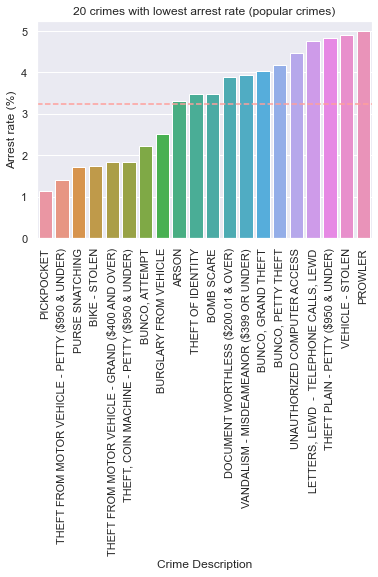

The horizontal line represents the average arrest rate over these 20 crimes.


In [41]:
Popular_crimes = grouped_outcome_long.copy()

#Retain crimes that have > 50 occurances.
Popular_crimes = Popular_crimes.loc[Popular_crimes["Total Crimes"] > 50]
#display(Popular_crimes)

sorted_crimes_outcome = Popular_crimes.sort_values(["Proportion Arrested"], ascending = True).reset_index()
sorted_crimes_outcome = sorted_crimes_outcome.nsmallest(20,"Proportion Arrested")

barplot(x_inputs = sorted_crimes_outcome["crm_cd_desc"],
       y_inputs = sorted_crimes_outcome["Proportion Arrested"],
       x_label = "Crime Description",
       title = "20 crimes with lowest arrest rate (popular crimes)",
       proportions = False,
       rotate = True,
       y_label = "Arrest rate (%)")

print("The horizontal line represents the average arrest rate over these 20 crimes.")

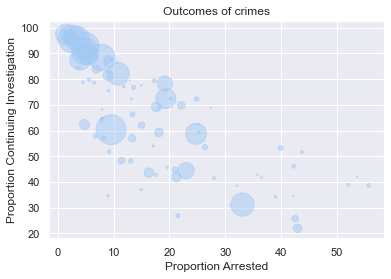

In [42]:
x = Popular_crimes["Proportion Arrested"]
y = Popular_crimes["Proportion Continuing"]
z = Popular_crimes["Proportion of Total Crimes"]

area_scatter(x,
             y,
             z,
             x_label = "Proportion Arrested",
             y_label = "Proportion Continuing Investigation",
             title = "Outcomes of crimes")

The trend of this scatter plot is to be expected as "Proportion Arrested" and "Proportion Continuing Investigation" are mutually exclusive classes. The interesting aspect is the that majority of crimes have a high proportion of continuing investigations. This is depicted by the size of the bubble. The bubble size represents the proportion of total crime that each crime constitutes. The overwhelming majority of crimes have an arrest rate lower than 50% - as depicted by the majority of bubbles being to the left of the value "Proportion Arrest" = 50. We can conclude that it is more often than not the case that no one is arrested for the crime. 

Another way to approach this problem is to plot *Proportion Arrested* against *Proportion of Total Crime*. This will allow us to see those crimes that were prevalent, but had low arrest rates.

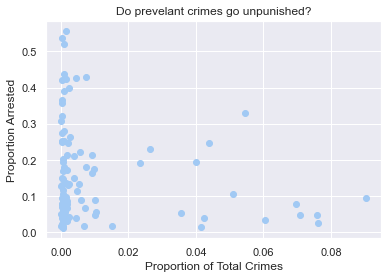

In [43]:
x = Popular_crimes["Proportion of Total Crimes"]/100
y = Popular_crimes["Proportion Arrested"]/100

plt.scatter(x,y)
plt.xlabel("Proportion of Total Crimes")
plt.ylabel("Proportion Arrested")
plt.title("Do prevelant crimes go unpunished?")
plt.show()

Any crimes near the bottom-right of the plot should be of concern to LAPD. Those are the crimes that are prevalent, but have low arrest rates. A secondary concern is those in the top-left. These are less prevalent crimes, but still have low arrest rates. LAPD may have a problem whereby they aren't collecting sufficient evidence to prosecute any of the perpetrators. This diagram, and the other tables in this section could serve as a focus for LAPD to dig deeper into how they collect evidence.

**Changes in outcomes over time**<br>
I calculated the count of each crime outcome per day and then plotted those on a line graph to see if there is an improvement in the arrest rate over time.

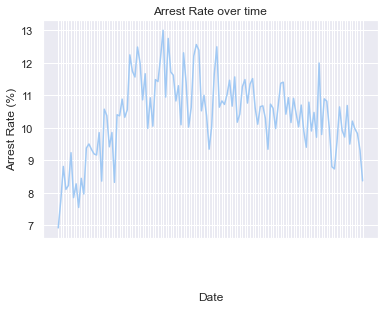

In [44]:

# convert dates to pandas datetime format
#data["Date"] = pd.to_datetime(data["date_occ"], format='%Y-%m-%d')

grouped_crimes_outcome = data.groupby(["Year", "Month", "status_desc"])["date_occ"].count().unstack("status_desc").reset_index()
grouped_crimes_outcome = grouped_crimes_outcome.fillna(0)
#display(grouped_crimes_outcome.head())

grouped_crimes_outcome["Date"] = grouped_crimes_outcome["Year"] + "-" + grouped_crimes_outcome["Month"]
grouped_crimes_outcome = grouped_crimes_outcome.drop(columns = ["Year" ,"Month"])

#Create a list of columns to sum over, removing the ones related to dates.
col_list = list(grouped_crimes_outcome)
col_list.remove("Date")

#Create a total column for each year/month combination.
grouped_crimes_outcome["Total"] = grouped_crimes_outcome[col_list].sum(axis =1)

ax = sns.lineplot(grouped_crimes_outcome["Date"], y=(grouped_crimes_outcome["Adult Arrest"]) / grouped_crimes_outcome["Total"] * 100)
ax.set_xlabel("Date")
ax.set_ylabel("Arrest Rate (%)")
ax.set_title("Arrest Rate over time")
#Rotate axis labels so they don't overlap.
ax.set_xticklabels(labels = grouped_crimes_outcome["Date"], rotation=90, color = 'w')
ax;

The arrest rate ranges in value from 7% over all crimes to 13% over all crimes. There is an uptrend from 2010-2014 to a maximum of 13% and then a consistent downtrend until the end of 2019. There is considerable cyclicality over the whole period but with a 6% range this may be acceptable to LAPD. What it does tell us more generally is that the arrest rate is falling - which is not good. There was potentially an organisational shift in ~2014 that caused the decline. The reason for this is, to us, unknown. However, if for example it is due to a cut in funding LAPD could use this graph to argue that funding cuts are having a measurable effect on crime prevention in Los Angeles. 

**Outcome depending on victim descent**<br>
I looked at whether the outcome of a crime differed depending who the victim was. This may, or may not, suggest whether there is cause for concern. If there is a statistical difference in the outcome depending on descent then it may be that different levels of effort are being devoted to catching the criminal, depending on the descent of the victim.

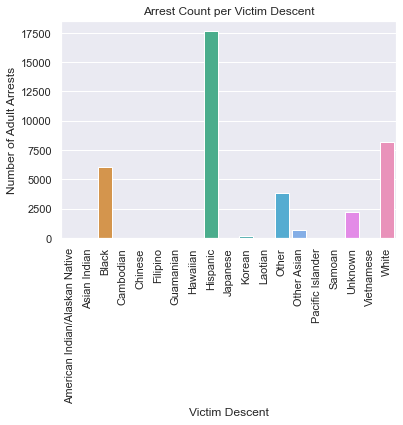

In [45]:
grouped_by_descent = data.copy()
grouped_by_descent = grouped_by_descent.groupby(["vict_descent", "status_desc"])["date_rptd"].count().reset_index()
grouped_by_descent = grouped_by_descent.pivot(index = "vict_descent", columns = "status_desc", values = "date_rptd").reset_index()
grouped_by_descent = grouped_by_descent.fillna(0) #Replace all NaN with 0 so we don't get math errors, and it looks tidier.
grouped_by_descent["Total"] = grouped_by_descent.sum(axis = 1)

barplot(x_inputs = grouped_by_descent["vict_descent"],
       y_inputs = grouped_by_descent["Adult Arrest"],
       x_label = "Victim Descent",
        y_label = "Number of Adult Arrests",
       proportions = False,
        title = "Arrest Count per Victim Descent",
       rotate = True,
       sup_line = True)

As with other graphs produced from this dataset, the small sample of some descents causes the graphs to be quite sparse for some classes. I could calculate the proportion of arrests for each *Victim Descent* but for the very small classes a small change in the number of arrests may drastically change the proportions. Hence, any interpretation by LAPD using those proportions could be misleading. The larger classes, such as Hispanic, White, and Black will be more robust to interpretation. I will first count the number of victims for each *Victim Descent* and remove those classes with significantly smaller samples.

In [46]:
#Sort by total crimes per victim descent
gbd_sorted = grouped_by_descent.sort_values(["Total"], ascending = False)

#Subset the 6 descents with the largest total crimes
gbd_largest = gbd_sorted.nlargest(6,"Total")

print(round(sum(gbd_sorted.iloc[:6,7])/sum(gbd_sorted.iloc[:,7])*100, 2), "% of crimes were committed against the 6 most popular Victim Descents.")

99.22 % of crimes were committed against the 6 most popular Victim Descents.


These top 6 *Victim Descents* make up approximately 99.2% of the total crimes. I will plot the same graph using those Victim descents only. It does not give LAPD a complete picture of whether there is systematic bias towards any of the victim descents, but should give them an idea. As usual I will calculate the proportion of arrests from the total crime committed against each Victim Descent.

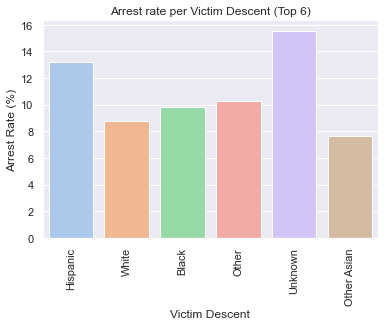

In [47]:
barplot(x_inputs = gbd_largest["vict_descent"],
       y_inputs = gbd_largest["Adult Arrest"] / gbd_largest["Total"]*100,
       x_label = "Victim Descent",
        y_label = "Arrest Rate (%)",
       proportions =False,
        title = "Arrest rate per Victim Descent (Top 6)",
       rotate = True,
       sup_line = True)

The difference in arrests rates is approximately 16% - 8% = 8% which may, or may not, be significant. To test this I will conduct a Chi-Squared Independence test for the 6 proportions above. This does not tell us about which victim descents are being treated differently, but it will tell us if conducting more tests is worthwhile.

In [48]:
from scipy.stats import chisquare, chi2

gbd_largest["Arrest Proportion"] = gbd_largest["Adult Arrest"] / gbd_largest["Total"] * 100

#I will use the mean arrest rate for all crimes as the expected arrest rate for each victim descent.
overall_arrests = grouped_outcome_long["Arrested"].sum(axis = 0)

#Find total number of crimes across all victims
total_crimes = data.groupby(["crm_cd_desc", "status_desc"])["date_rptd"].count().sum()

#Calculate average arrest rate - including small sample size crimes.
expected_arrest_rate = overall_arrests / total_crimes * 100
print("The overall average Arrest Rate is:", round((expected_arrest_rate),2), "%")
print("")

#Calculate critical p-value from chi squared distribution
ChiStat, Pval = chisquare([13,9,10,10,16,8], [expected_arrest_rate] * 6)

#Calculate Chi squared critical value
chivalue = chi2.isf(q = 0.05, df = 5)

print("There is statistical evidence that we should reject the null hypothesis (that all Arrest Rates are the same), \
in favour of the alternative hypothesis (that at least one of the Arrest Rates is statistically different from the others). We can see this as\
 the Chi Squared statistic of", round(ChiStat,2), "exceeds the p-value of", round(Pval, 2), "at the 0.05 significance level.")

The overall average Arrest Rate is: 11.11 %

There is statistical evidence that we should reject the null hypothesis (that all Arrest Rates are the same), in favour of the alternative hypothesis (that at least one of the Arrest Rates is statistically different from the others). We can see this as the Chi Squared statistic of 3.97 exceeds the p-value of 0.55 at the 0.05 significance level.


To see which pairs are significantly different I will use the Marascuillo Procedure to test each pair of *Victim Descent*s. Source: https://www.itl.nist.gov/div898/handbook/prc/section4/prc464.htm

In [49]:
#Display the proportion of arrests for each of the 6 Victim Descents under investigation.
display(gbd_largest)

status_desc,vict_descent,Adult Arrest,Adult Other,Invest Cont,Juv Arrest,Juv Other,UNK,Total,Arrest Proportion
8,Hispanic,17663,19047,94860,1434,544,4,133552,13
18,White,8221,10173,75157,468,140,1,94160,9
2,Black,6028,10443,44445,476,172,2,61566,10
12,Other,3843,3613,29839,208,44,1,37548,10
16,Unknown,2251,815,11251,146,18,0,14481,16
13,Other Asian,724,874,7793,54,12,0,9457,8


In [50]:
for i in gbd_largest["vict_descent"]:
    row = gbd_largest[gbd_largest["vict_descent"] == i]
    n_i = row.iloc[:,7].values[0]
    p_i = row.iloc[:,8].values[0]/100
    for j in gbd_largest["vict_descent"]:
        row2 = gbd_largest[gbd_largest["vict_descent"] == j]
        n_j = row2.iloc[:,7].values[0]
        p_j = row2.iloc[:,8].values[0]/100
        critical_value = np.sqrt(chivalue)*((p_i*(1-p_i))/(n_i)+(p_j*(1-p_j))/(n_j))
        difference = p_i - p_j
        if critical_value < difference and i is not j:
            print("The difference in the proportions of arrests between", i,"and", j, "is significant")
        elif critical_value > difference and i is not j:
            #print("The difference in the proportions of arrests between", i,"and", j, "is NOT significant")
            pass
        else:
            pass

The difference in the proportions of arrests between Hispanic and White is significant
The difference in the proportions of arrests between Hispanic and Black is significant
The difference in the proportions of arrests between Hispanic and Other is significant
The difference in the proportions of arrests between Hispanic and Other Asian is significant
The difference in the proportions of arrests between White and Other Asian is significant
The difference in the proportions of arrests between Black and White is significant
The difference in the proportions of arrests between Black and Other Asian is significant
The difference in the proportions of arrests between Other and White is significant
The difference in the proportions of arrests between Other and Black is significant
The difference in the proportions of arrests between Other and Other Asian is significant
The difference in the proportions of arrests between Unknown and Hispanic is significant
The difference in the proportions o

There does indeed seem to be a statistically significant difference between, for example, the arrest rate of Hispanic victims and Black, White, Other, and Other Asian victims. It is worth noting that *Other Asian* has a statistically significantly lower arrest rate than all of the other 5 descents. LAPD should consider why this is. There is reason to argue that the cases are being treated differently. We can exclude any influence by the criminal here as it does not make sense why the criminal would be more vigilant against leaving evidence depending on the descent of their victim. It is obvious that the criminal would, in all instances, want to reduce the amount of evidence they leave at the scene; regardless of the victim's descent.

**Outcome depending on gender**<br>
Similarly we can see whether the outcome of the crime is dependant on the gender of the victim.

I will remove *Victim Sex: Unknown* as these are mostly crimes against property and similar. I believe these are errors on the part of LAPD as even if these crimes were against a property, it must still be owned by a person - who naturally has a gender. I would agree that if the victim is of type *Public* or *Justice* then these are a collection of people and hence *victim sex* is not appropriate. However, as we can see below (row "crm_cd_desc") there is 98 unique crimes with a least 1 *Victim Sex = Unknown* so I believe this is an error.

In [51]:
print(data[data["vict_sex"] == "Unknown"].nunique())

date_rptd       2472
date_occ        2442
time_occ         832
area              21
area_name         21
crm_cd            98
crm_cd_desc       98
vict_age          65
vict_sex           1
vict_descent       7
premis_desc      183
status_desc        5
location        4308
lat             1999
lon             2027
weapon_desc       52
Year              10
Month             12
Day               31
Victim Type        6
dtype: int64


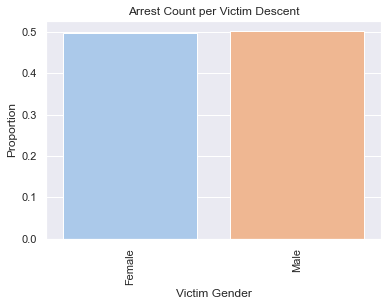

In [52]:
grouped_by_gender = data.copy()
grouped_by_gender = grouped_by_gender.groupby(["vict_sex", "status_desc"])["date_rptd"].count().reset_index()
grouped_by_gender = grouped_by_gender[grouped_by_gender["vict_sex"].isin(["Male", "Female"])]
grouped_by_gender = grouped_by_gender.pivot(index = "vict_sex", columns = "status_desc", values = "date_rptd").reset_index()
grouped_by_gender = grouped_by_gender.fillna(0) #Replace all NaN with 0 so we don't get math errors, and it looks tidier.
grouped_by_gender["Total"] = grouped_by_gender.sum(axis = 1)

barplot(x_inputs = grouped_by_gender["vict_sex"],
       y_inputs = grouped_by_gender["Adult Arrest"],
       x_label = "Victim Gender",
        y_label = "Number of Adult Arrests",
       proportions = True,
        title = "Arrest Count per Victim Descent",
       rotate = True,
       sup_line = True)

We can visually see that the arrest rate is almost identical for Male and Female. There seems to be no bias towards either gender on a general basis. However, we have already seen that on a per crime basis there is a bias towards either gender depending on what crime the criminal is intending to commit.

**Conclusion - Outcome Centred**<br>
In conclusion there is unequivocally a bias against *Other Asian* victims. The arrest rate for crimes against that group of people was significantly lower than the other groups. If LAPD wants to encourage all people to feel welcome, and more importantly safe, in Los Angeles then they need to improve this and conduct investigations with the same vigour. On a more general level the arrest rate is, I personally feel, low for almost all crimes which does give me concern. Without the same data from other areas it is difficult to say if Los Angeles is worse, but from a gut feeling, knowing that it is more likely someone won't be arrested for committing a crime, does not give me comfort.

The second most notable thing is the decreasing arrest rate over time for crime in Los Angeles generally. Again, with no other similar cities to compare it to we can't categorically say if, even though decreasing, Los Angeles arrest rate is bad, but the downward trend may be enough to put people off from moving to LA.

# Location Centred

**Crimes in each location**<br>

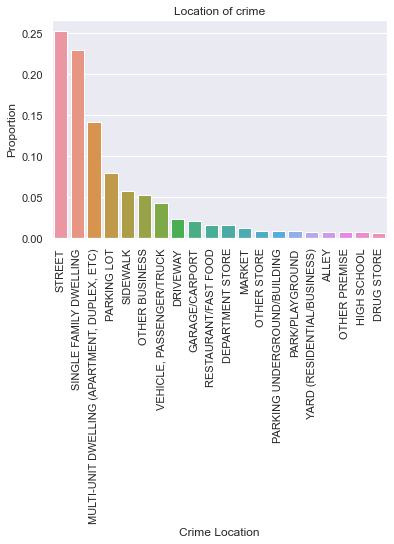

In [53]:
#Let's group by the crime location, count up the number of crimes at each of those locations and plot in descending order.
sorted_location = data.groupby(["premis_desc"]).count()
sorted_location = sorted_location.nlargest(20,"crm_cd")
sorted_location = sorted_location.sort_values(["crm_cd"], ascending = False).reset_index()

barplot(x_inputs = sorted_location["premis_desc"],
       y_inputs = sorted_location["crm_cd"],
       x_label = "Crime Location",
       proportions = True,
        title = "Location of crime",
       rotate = True,
       sup_line = True)

*The Street*, *Single Family Dwelling*, and *Multi-Unit Dwellings* make up a large portion of the total crimes. It would be natural to suggest LAPD start looking more closely at these areas but these location descriptions are very broad - we're basically saying that most crime happens outside, or inside, which is obviously not much help. Therefore, I would be tempted to suggest LAPD consider more precise location descriptions. For example, *Street* could be replaced with: *Populated street*, *Low Populated Street*, or *Secluded back street*. Further there is no obvious reason why one crime would be recorded under *Street* and another under *Sidewalk* - I would argue *Sidewalk* is a subset of *Street*, i.e. if a crime occurs on the *Sidewalk* then it must also have occurred on the *Street*.

It is tempting to create a heatmap of location versus crime but given that a lot of crimes are dependant on the location there was a lot of blank cells in the heatmap and so I removed it.

**Conclusion - Location Centred**<br>
More detail needs to be recorded relating to the *Premise_desc* of the crime to be a useful variable. Currently we can make generalisations, but not much more.

# Time Centred
I will group by different time values to see if any patterns emerge that can be actioned upon. We may have an intuition that crime might increase near the end of the month, when people become poorer, or perhaps at the end of the year, when people are storing more Christmas presents in their homes.

**Crimes by Month**<br>

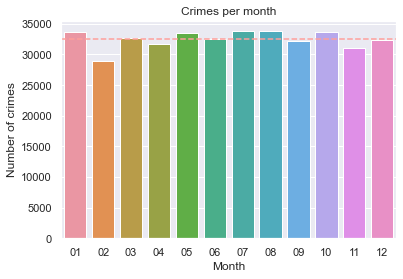

In [54]:
grouped_crimes_by_month = data.groupby(["Month"]).count()
sorted_crimes = grouped_crimes_by_month.sort_values(["Month"], ascending = True).reset_index() #Sort values by month, 1 first, up to 12.

barplot(x_inputs = sorted_crimes["Month"],
        y_inputs=sorted_crimes["date_rptd"],
        y_label = "Number of crimes",
        x_label = "Month",
        proportions = False,
        title = "Crimes per month")

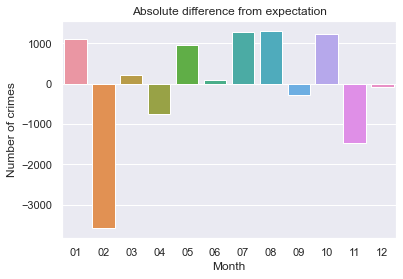

In [55]:
#This graph makes some of the differences difficult to see. Therefore, I will redefine the baseline of the graph to be the expected number of crimes...
#... for each month if all months were equally likely (total count of crime/number of months.)

#Calculate the difference for each month from the expected number of crimes per month
sorted_crimes["Difference"] = sorted_crimes["date_rptd"] - (sum(sorted_crimes["date_rptd"]) / 12)

grouped_crimes_by_month = data.groupby(["Month"]).count() #Groupby month
sorted_crimes = grouped_crimes_by_month.sort_values(["Month"], ascending = True).reset_index() #Sort values by month, 1 first, up to 12.

#Calculate the difference for each month from the expected number of crimes per month (total crimes / 12)
sorted_crimes["Difference"] = sorted_crimes["date_rptd"] - (sum(sorted_crimes["date_rptd"]) / 12)

barplot(x_inputs = sorted_crimes["Month"],
       y_inputs = sorted_crimes["Difference"],
       x_label = "Month",
       y_label = "Number of crimes",
       proportions = False,
       sup_line = True,
       title = "Absolute difference from expectation")

There is an approximately 3,800 difference in month 2 (February) compared to the expected crimes per month (if crimes were equally likely in each month), but when we look at the previous graph we see that this value is less than 10% of crimes for any month. This may be statistically significant if I was to run a hypothesis test comparing the proportions but even if it was I do not see the interpretation being useful for LAPD. If we suppose any one particular month was more prevalent, then how would LAPD do things differently? They probably would not. It would make little sense for them to, in this case, temporarily reduce the number of officers for February (as they expect less crime) to then have to re-employ them again the next month. I ran this visualisation to see if there was any seasonality (such as a spike in December relating to Christmas), but that does not seem to be the case.

**Crimes by Day**<br>
I will now see if there is any reason to believe that any one day of the month is more likely to induce a crime than any other.

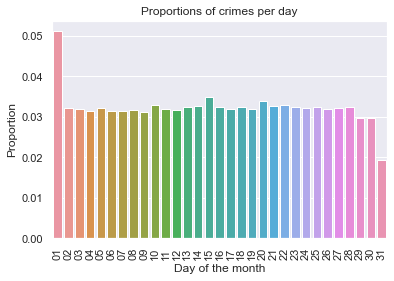

In [56]:
grouped_crimes_by_day = data.groupby(["Day"]).count()
sorted_crimes = grouped_crimes_by_day.sort_values(["Day"]).reset_index()

barplot(x_inputs = sorted_crimes["Day"],
       y_inputs = sorted_crimes["vict_age"],
       x_label = "Day of the month",
       proportions = True,
       rotate = True,
       title = "Proportions of crimes per day",
       sup_line = True)

Not every month has 31 days (only 7 do). Therefore, we do not get an even probability of a crime being committed on the 31st as we do on the dates 1st-27th (as every month includes those). I conjecture that there may be an underlying weekly cycle rather than monthly cycle present. For example criminals may target people on the last Friday of every month - maybe they assume that is most often payday for people who work - and in those 5 months that don't include a 31st day that the 1st falls into the end of "payday week" as it may be thought of.

In [57]:
data.head()

,date_rptd,date_occ,time_occ,area,area_name,crm_cd,crm_cd_desc,vict_age,vict_sex,vict_descent,premis_desc,status_desc,location,lat,lon,weapon_desc,Year,Month,Day,Victim Type
dr_no,,,,,,,,,,,,,,,,,,,,
121513381,2012-06-16,2012-05-23,1513,15,N Hollywood,649,DOCUMENT FORGERY / STOLEN FELONY,35,Female,Hispanic,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,5600 LAUREL CANYON BL,34,-118,No weapon used,2012,05,23,Property
101406550,2010-02-09,2010-02-08,1030,14,Pacific,440,THEFT PLAIN - PETTY ($950 & UNDER),25,Female,White,SINGLE FAMILY DWELLING,Invest Cont,4300 LYCEUM AV,34,-118,No weapon used,2010,02,08,Property
181504799,2018-01-16,2018-01-15,1830,15,N Hollywood,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",19,Female,Hispanic,"VEHICLE, PASSENGER/TRUCK",Invest Cont,5700 CLEON AV,34,-118,No weapon used,2018,01,15,Property
132104062,2013-01-02,2013-01-01,1600,21,Topanga,330,BURGLARY FROM VEHICLE,48,Female,White,PARKING LOT,Invest Cont,19700 VENTURA BL,34,-119,No weapon used,2013,01,01,Property
141118912,2014-10-30,2014-09-29,1200,11,Northeast,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),44,Female,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",Invest Cont,2000 N VERMONT AV,34,-118,No weapon used,2014,09,29,Property


**Conclusion - Time Centred**<br>
**Day data**: Overall I subjectively think that there is little reason to believe that any day of the month is any more likely to include a crime than any other. Prior to plotting the graph I would have expected to see some increase near the end and the start of the months. The reason is that people often get paid at the end of the month and committing a crime then would be most profitable. However, this may be a sign of the changing times as people's wages are almost exclusively paid into a bank account now and not carried around in large sums of cash as used to be the case. There is a large spike on the 1st of the month which would corroborate this intuition but as described previously, not every month contains 31 days.

Overall there seems to be no pattern, or cyclicality to when crime occurs. We may intuitively think that crime might increase near the end of the month but in retrospect, and backed up by the data, this seems baseless. Consider the career criminals, they have no regular employment and don't fall into the same monthly cycle of *starting off wealthier at the beginning of the month and becoming poorer* as their income is based on irregular, potentially serendipitous crimes. Hence they are consistently committing crime as a way of life, not because their regular employment has left them poorer near the end of the month. We could argue that criminals would target people more after the victim's employment payday but again this is counterintuitive. A criminal would not sit at home for 3 weeks and go on a crime spree at the end of the month. For them it is a way of life and they are always on the look out for opportune moments, regardless of the day of the month. This is shown in the "Day" data (ignoring the potential error already discussed) by the almost uniform distribution over the 31 days.

# Crimes on a map
Below I have created a map where each point is a distinct crime and the map can be interactively controlled with the options on the bottom left of the canvas. We can see that the crimes are evenly distributed on any given day. There also does not seem to be any large consistent hot spot areas. The map also gives us more information about why the crime in Topanga was so low, because a lot of the area is comprised of Topanga State Park, which will be less densly populated. This is something I would not have known without seeing the data plotted onto a map. I have saved the outcome as a HTML file in the same folder as this notebook.

**Extension**<br>
There are extensions I would have liked to make to the map, such as different layers for each *Victim Type* but my local machine was unable to handle the amount of processing required. 

In [59]:
import folium
from folium import plugins

m = folium.Map([33.9825, -118.2695], zoom_start=10.5, prefer_canvas = True)

data2 = []
for _, d in data.groupby('date_occ'):
    data2.append([[row['lat'], row['lon'], row['crm_cd']] for _, row in d.iterrows()])

# plot heatmap
m.add_child(plugins.HeatMapWithTime(data2, radius=6))

# add the layer control
folium.LayerControl().add_to(m)

m.save("Map.html")
m

The map may not display due to some Trust Notebook/GitHub conflictions so I have saved the output as Map.html in the same repo

# Overall Conclusion
The dataset is complete enough to conduct lots of useful visualisations and statistical tests to investigate for biases. It does include lots of empty cells but as a proportion of the total sample this is not out of the ordinary (Objective 1). If I were advising LAPD I would make collecting *Victim Age* a priority. This caused a lot of crimes to be dropped which otherwise contained useful information. 

The usefulness of this dataset would increase measurably if the below variables were available:
* More information about the conviction. We only know the binary outcome of the crime - whether an arrest was made. However, if we knew more about the outcome, such as the date a person was arrested, then we could test to see if LAPD are decreasing the time it takes to get a conviction.
* If I knew the address or neighbourhood (to retain anonymity) of the criminal then I could analyse whether criminals committed crime on their own door-step, or whether they were based outside of the areas that they committed crime in.
* Granular demographic information about the population of Los Angeles as a whole. Out-of-sample comparisons were impossible as we are unaware of the construction of the population of LA. If, ideally monthly, although yearly would work well, census-like data were available we could more accurately look at whether the Victim Age, Victim Gender, and Victim Descent inferences have changed over the 2010-2019 span of this dataset.
* More granular categorise for the severity of a crime. This would allow us to weight each of the crimes in an area to get a better idea if any area is characterised by low level or high level crime. This would also allow us to see if any areas have more White collar or Blue collar crime and compare this with what the media tells us (Objective 2).

I did find a dataset of arrest details for the same time period as this dataset that gave some information that would have been useful. However, there was no common key that I could join the datasets together with. I had hoped the *dr_no* in the dataset I have used to match up, but it did not. I have included a sample of this *Arrests.csv* in repo alongside this notebook for interest.

Some variables were also too broad to be of much use. *Premise_desc* was too broad with most crimes happening on the *Street* or inside a person's home, which is most crime, meaning the column doesn't give us much useful information.

## Extension to this study
* I would have liked to have binned the *Victim Age* variable to more accurately describe the most common victims for each crime but this would have required intense computation, and given the lack of population demographic data as described above, would have only led to inference based on the assumption that the demographics did not change over 10 years, which may be a bit of a stretch. I attempted to create a Folium TimedGeoJSON map but it quickly exhausted the capabilities of my local machine. I could have aggregated the data into monthly markers but this would lose most of the important information that would characterise the landscape of crime in LA.
* I would try to gather income data for each of the 21 areas to see if there is a correlation between income, or indirectly house prices, with the amount of property crime.
* Further it would be interesting to see if the areas that attract tourists experience a different type of crime. My intuition tells me that *Crimes against the Person* would be higher in those areas densely populated with tourists who may not be as vigilantly guarding their possessions from pickpockets.

## Takeaways
We have learnt much about crime in LA, much of it actionable for LAPD. Most notably the differences in crime by Area, where *Crimes against Property* are more popular in some areas than *Crimes against the Person*, and the crimes most common to each gender. LAPD should be able to take this information and more astutely inform its citizens on a personal basis what crimes they should look out for. This is naturally not to say that every gender should not try to safeguard against every crime, even if it is vastly more common that another gender is most often the victim of a particular crime, but the ability to make more impactful, general statements, to large audiences is very important.